In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import copy
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

print(sorted(plt.rcParams.keys()))
config = {
    'font.size':12.0,
    'font.family':['DejaVu Serif'],
    'mathtext.fontset':'dejavuserif',
    'mathtext.rm':'DejaVu Serif',
    'figure.figsize':[6.4, 4.8], # default is [6.4, 4.8],
    'xtick.major.size':3.5,
    'ytick.major.size':3.5,
    'figure.autolayout':True
}
plt.rcParams.update(config)
cmap_colors = copy.copy(plt.get_cmap('RdBu_r')) # RdBu_r, Blues, GnBu, PuBu

plev = np.array([
13.576     , 11.115     , 9.1001     , #3
7.4506     , 6.1000     , 4.9943     , #6
4.0890     , 3.3478     , 2.7409     , #9
2.2441     , 1.8373     , 1.5042     , #12
1.2316     , 1.0083     , 0.82555    , #15
0.67590    , 0.55338    , 0.45307    , #18
0.37094    , 0.30370    , 0.24865    , #21
0.20358    , 0.16667    , 0.13646    , #24
0.11173    , 9.14730E-02, 7.48918E-02, #27
6.13162E-02, 5.02015E-02, 4.11015E-02, #30
3.36510E-02, 2.75511E-02, 2.25570E-02, #33
1.84681E-02, 1.51204E-02, 1.23795E-02, #36
1.01355E-02, 8.29825E-03, 6.79403E-03, #39
5.56248E-03, 4.55417E-03, 3.72864E-03, #42
3.05275E-03, 2.49938E-03, 2.04632E-03, #45
1.67539E-03, 1.37169E-03, 1.12304E-03, #48
9.19472E-04, 7.52800E-04, 6.16340E-04, #51
5.04617E-04, 4.13145E-04, 3.38255E-04, #54
2.76940E-04, 2.26739E-04, 1.85638E-04, #57
1.51988E-04, 1.24437E-04, 1.01880E-04, #60
8.34126E-05, 6.82925E-05, 5.59131E-05, #63
4.57778E-05, 3.74797E-05, 3.06858E-05, #66
2.51234E-05, 2.05693E-05, 1.68407E-05, #69
1.37880E-05
])

layers = np.array([
#0.000000, 
0.001000, 0.002600,
0.005160, 0.009256, 0.015810,
0.026295, 0.043073, 0.069916,
0.112866, 0.181585, 0.291536,
0.467458, 0.748933, 1.199293,
1.919869, 3.072791, 4.917465,
7.868944, 12.591311, 20.147097
])

Ls = [
      0.250,   0.761,   1.270,   1.779,   2.286,   2.793,   3.299,
      3.804,   4.309,   4.812,   5.315,   5.817,   6.319,   6.819,
      7.319,   7.818,   8.316,   8.814,   9.311,   9.807,  10.302,
     10.797,  11.291,  11.784,  12.277,  12.768,  13.260,  13.750,
     14.240,  14.729,  15.217,  15.705,  16.192,  16.679,  17.165,
     17.650,  18.134,  18.618,  19.102,  19.584,  20.066,  20.548,
     21.029,  21.509,  21.988,  22.468,  22.946,  23.424,  23.901,
     24.378,  24.854,  25.330,  25.805,  26.279,  26.753,  27.227,
     27.700,  28.172,  28.644,  29.115,  29.586,  30.057,  30.526,
     30.996,  31.465,  31.933,  32.401,  32.868,  33.335,  33.802,
     34.268,  34.734,  35.199,  35.664,  36.128,  36.592,  37.055,
     37.518,  37.981,  38.443,  38.905,  39.367,  39.828,  40.288,
     40.749,  41.209,  41.668,  42.127,  42.586,  43.045,  43.503,
     43.961,  44.418,  44.875,  45.332,  45.789,  46.245,  46.701,
     47.157,  47.612,  48.067,  48.522,  48.976,  49.430,  49.884,
     50.338,  50.792,  51.245,  51.698,  52.150,  52.603,  53.055,
     53.507,  53.959,  54.411,  54.862,  55.313,  55.764,  56.215,
     56.666,  57.116,  57.567,  58.017,  58.467,  58.917,  59.367,
     59.816,  60.266,  60.715,  61.164,  61.613,  62.062,  62.511,
     62.960,  63.409,  63.857,  64.306,  64.754,  65.203,  65.651,
     66.099,  66.547,  66.995,  67.444,  67.892,  68.340,  68.788,
     69.236,  69.684,  70.132,  70.580,  71.028,  71.476,  71.924,
     72.372,  72.820,  73.268,  73.717,  74.165,  74.613,  75.062,
     75.510,  75.958,  76.407,  76.856,  77.304,  77.753,  78.202,
     78.651,  79.100,  79.550,  79.999,  80.449,  80.898,  81.348,
     81.798,  82.248,  82.698,  83.149,  83.599,  84.050,  84.501,
     84.952,  85.404,  85.855,  86.307,  86.759,  87.211,  87.664,
     88.116,  88.569,  89.022,  89.475,  89.929,  90.383,  90.837,
     91.291,  91.746,  92.201,  92.656,  93.112,  93.568,  94.024,
     94.480,  94.937,  95.394,  95.851,  96.309,  96.767,  97.225,
     97.684,  98.143,  98.602,  99.062,  99.522,  99.983, 100.440,
    100.910, 101.370, 101.830, 102.290, 102.750, 103.220, 103.680,
    104.150, 104.610, 105.080, 105.540, 106.010, 106.470, 106.940,
    107.410, 107.870, 108.340, 108.810, 109.280, 109.750, 110.220,
    110.690, 111.160, 111.630, 112.110, 112.580, 113.050, 113.530,
    114.000, 114.470, 114.950, 115.430, 115.900, 116.380, 116.860,
    117.340, 117.810, 118.290, 118.770, 119.250, 119.740, 120.220,
    120.700, 121.180, 121.670, 122.150, 122.640, 123.120, 123.610,
    124.090, 124.580, 125.070, 125.560, 126.050, 126.540, 127.030,
    127.520, 128.010, 128.510, 129.000, 129.490, 129.990, 130.490,
    130.980, 131.480, 131.980, 132.480, 132.980, 133.480, 133.980,
    134.480, 134.980, 135.480, 135.990, 136.490, 137.000, 137.510,
    138.010, 138.520, 139.030, 139.540, 140.050, 140.560, 141.070,
    141.590, 142.100, 142.610, 143.130, 143.650, 144.160, 144.680,
    145.200, 145.720, 146.240, 146.760, 147.280, 147.810, 148.330,
    148.860, 149.380, 149.910, 150.440, 150.970, 151.500, 152.030,
    152.560, 153.090, 153.620, 154.160, 154.690, 155.230, 155.770,
    156.300, 156.840, 157.380, 157.920, 158.470, 159.010, 159.550,
    160.100, 160.640, 161.190, 161.740, 162.290, 162.840, 163.390,
    163.940, 164.490, 165.040, 165.600, 166.150, 166.710, 167.270,
    167.830, 168.390, 168.950, 169.510, 170.070, 170.630, 171.200,
    171.770, 172.330, 172.900, 173.470, 174.040, 174.610, 175.180,
    175.750, 176.330, 176.900, 177.480, 178.050, 178.630, 179.210,
    179.790, 180.370, 180.950, 181.540, 182.120, 182.700, 183.290,
    183.880, 184.470, 185.050, 185.640, 186.230, 186.830, 187.420,
    188.010, 188.610, 189.200, 189.800, 190.400, 191.000, 191.600,
    192.200, 192.800, 193.400, 194.000, 194.610, 195.210, 195.820,
    196.430, 197.030, 197.640, 198.250, 198.860, 199.480, 200.090,
    200.700, 201.320, 201.930, 202.550, 203.160, 203.780, 204.400,
    205.020, 205.640, 206.260, 206.880, 207.510, 208.130, 208.750,
    209.380, 210.000, 210.630, 211.260, 211.890, 212.520, 213.150,
    213.780, 214.410, 215.040, 215.670, 216.300, 216.940, 217.570,
    218.210, 218.840, 219.480, 220.110, 220.750, 221.390, 222.030,
    222.670, 223.310, 223.950, 224.590, 225.230, 225.870, 226.520,
    227.160, 227.800, 228.450, 229.090, 229.740, 230.380, 231.030,
    231.670, 232.320, 232.960, 233.610, 234.260, 234.910, 235.550,
    236.200, 236.850, 237.500, 238.150, 238.800, 239.450, 240.100,
    240.750, 241.400, 242.050, 242.700, 243.350, 244.000, 244.650,
    245.310, 245.960, 246.610, 247.260, 247.910, 248.560, 249.210,
    249.870, 250.520, 251.170, 251.820, 252.470, 253.120, 253.780,
    254.430, 255.080, 255.730, 256.380, 257.030, 257.680, 258.330,
    258.980, 259.630, 260.280, 260.930, 261.580, 262.230, 262.880,
    263.530, 264.180, 264.830, 265.480, 266.120, 266.770, 267.420,
    268.060, 268.710, 269.350, 270.000, 270.650, 271.290, 271.930,
    272.580, 273.220, 273.860, 274.510, 275.150, 275.790, 276.430,
    277.070, 277.710, 278.350, 278.990, 279.620, 280.260, 280.900,
    281.530, 282.170, 282.800, 283.440, 284.070, 284.700, 285.330,
    285.970, 286.600, 287.230, 287.850, 288.480, 289.110, 289.740,
    290.360, 290.990, 291.610, 292.240, 292.860, 293.480, 294.100,
    294.730, 295.340, 295.960, 296.580, 297.200, 297.820, 298.430,
    299.050, 299.660, 300.270, 300.880, 301.500, 302.100, 302.710,
    303.330, 303.930, 304.540, 305.140, 305.750, 306.350, 306.950,
    307.560, 308.160, 308.760, 309.360, 309.950, 310.550, 311.150,
    311.740, 312.340, 312.930, 313.520, 314.110, 314.700, 315.290,
    315.880, 316.470, 317.050, 317.640, 318.220, 318.810, 319.390,
    319.970, 320.550, 321.130, 321.710, 322.290, 322.860, 323.440,
    324.010, 324.580, 325.160, 325.730, 326.300, 326.870, 327.430,
    328.000, 328.570, 329.130, 329.700, 330.260, 330.820, 331.380,
    331.940, 332.500, 333.060, 333.620, 334.170, 334.730, 335.280,
    335.840, 336.390, 336.940, 337.490, 338.040, 338.590, 339.130,
    339.680, 340.220, 340.770, 341.310, 341.850, 342.390, 342.940,
    343.470, 344.010, 344.550, 345.090, 345.620, 346.160, 346.690,
    347.220, 347.760, 348.290, 348.820, 349.350, 349.870, 350.400,
    350.930, 351.450, 351.980, 352.500, 353.020, 353.550, 354.070,
    354.590, 355.110, 355.620, 356.140, 356.660, 357.170, 357.690,
    358.200, 358.720, 359.230, 359.740
]

def localtime_aligner(dat,nx,deg):
    dat_local = np.zeros_like(dat)
    j=0 # initialize
    for i in range(nx):
        if (abs(15*j-deg*i) < 7.5):
            dat_local[:,:,:,:,:,:,i] = np.roll(dat[:,:,:,:,:,:,i], -24+j, axis=3)
        else:
            j=j+1
            dat_local[:,:,:,:,:,:,i] = np.roll(dat[:,:,:,:,:,:,i], -24+j, axis=3)
    return dat_local

def day_average(dat): # data.shape should be [nf,nv,nd,nt,nz,ny,nx]
    return np.mean(dat, axis=2)

def roll_longitude(dat,nx):
    return np.roll(dat, int(nx/2), axis=-1)

def zonal_mean(dat):
    return np.mean(dat, axis=-1)

['_internal.classic_mode', 'agg.path.chunksize', 'animation.avconv_args', 'animation.avconv_path', 'animation.bitrate', 'animation.codec', 'animation.convert_args', 'animation.convert_path', 'animation.embed_limit', 'animation.ffmpeg_args', 'animation.ffmpeg_path', 'animation.frame_format', 'animation.html', 'animation.html_args', 'animation.writer', 'axes.autolimit_mode', 'axes.axisbelow', 'axes.edgecolor', 'axes.facecolor', 'axes.formatter.limits', 'axes.formatter.min_exponent', 'axes.formatter.offset_threshold', 'axes.formatter.use_locale', 'axes.formatter.use_mathtext', 'axes.formatter.useoffset', 'axes.grid', 'axes.grid.axis', 'axes.grid.which', 'axes.labelcolor', 'axes.labelpad', 'axes.labelsize', 'axes.labelweight', 'axes.linewidth', 'axes.prop_cycle', 'axes.spines.bottom', 'axes.spines.left', 'axes.spines.right', 'axes.spines.top', 'axes.titlepad', 'axes.titlesize', 'axes.titleweight', 'axes.unicode_minus', 'axes.xmargin', 'axes.ymargin', 'axes3d.grid', 'backend', 'backend_fall

In [2]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls150/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls180/',
#    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
    '/mnt/dram2/koba/data/MIRAI1k-active-adsinhom-Ls180-test/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls210-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls210/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls210/',
]
variables = [
    'PS-1h',
    'colwv2-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150-inactive/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150-inactive/colwv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls150/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls150/colwv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls150/colwv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/colwv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls180/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20-Ls180/colwv2-1h.asc
/mnt/dram2/koba/data/MIRAI1k-active-adsinhom-Ls180-test/PS-1h.asc
/mnt/dram2/koba/data/MIRAI1k-active-adsinhom-Ls180-test/colwv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-acti

In [3]:
deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°
#data_local_ave_zm = zonal_mean(data_local_ave) # zonal mean

ps = data_local_ave_roll[:,0,14,0,:,:]*1e2
wv = data_local_ave_roll[:,1,14,0,:,:]*1e6
#ps = data_local_ave_roll[:,0,2,0,:,:]*1e2
#wv = data_local_ave_roll[:,1,2,0,:,:]*1e6
scaled_wv = wv / (ps / 610)
print(scaled_wv.shape)

(9, 32, 64)


k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2
k,j,i =  0 1 3
k,j,i =  1 1 4
k,j,i =  2 1 5
k,j,i =  0 2 6
k,j,i =  1 2 7
k,j,i =  2 2 8


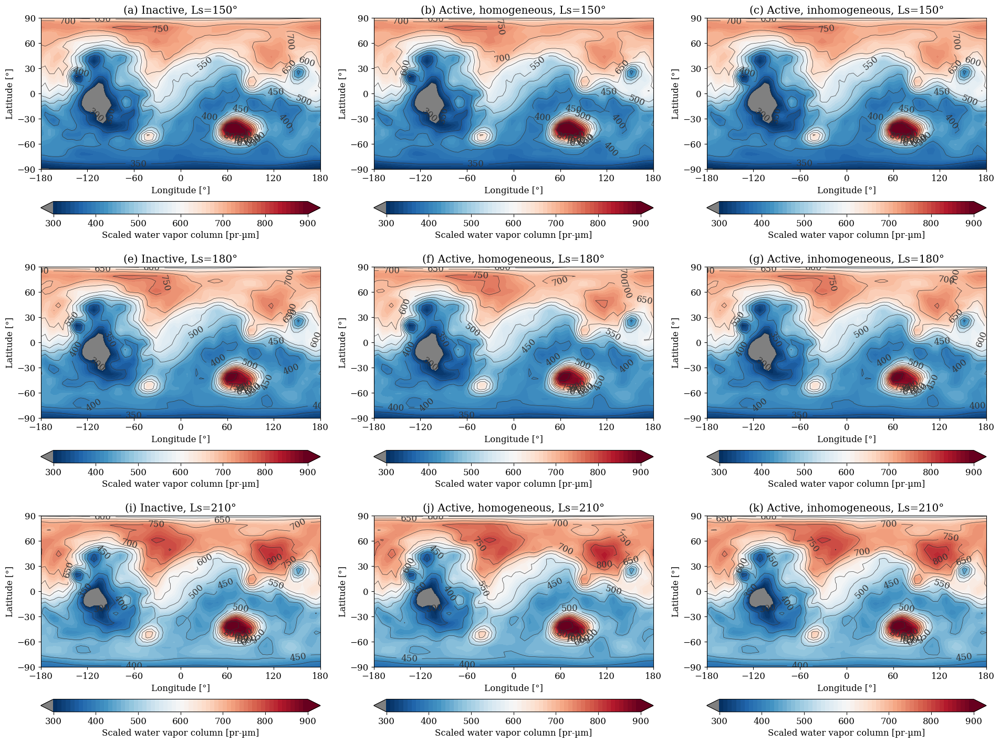

In [6]:
titles = [
    '(a) Inactive, Ls=150°',
    '(b) Active, homogeneous, Ls=150°',
    '(c) Active, inhomogeneous, Ls=150°',
#    '(d) TES observations, Ls=150°',
    '(e) Inactive, Ls=180°',
    '(f) Active, homogeneous, Ls=180°',
    '(g) Active, inhomogeneous, Ls=180°',
#    '(h) TES observations, Ls=180°',
    '(i) Inactive, Ls=210°',
    '(j) Active, homogeneous, Ls=210°',
    '(k) Active, inhomogeneous, Ls=210°',
#    '(l) TES observations, Ls=210°',
]
Z = ps
levels = [
    np.arange(300,900.1,10),
    np.arange(300,900.1,10),
    np.arange(300,900.1,10),
    np.arange(0,28.1,1),
    np.arange(0,28.1,1),
]
labels = [
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
]


ncols,nrows=3,3
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under('0.5')
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i,:,:],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::10], 
    ).set_label(
        labels[j]
    )
    cs = ax.contour(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i,:,:],
        colors='0.2', linewidths=0.5, 
        levels=levels[j][::5]
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title(titles[i])
plt.show()

k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2


k,j,i =  0 1 3
k,j,i =  1 1 4
k,j,i =  2 1 5
k,j,i =  0 2 6
k,j,i =  1 2 7
k,j,i =  2 2 8


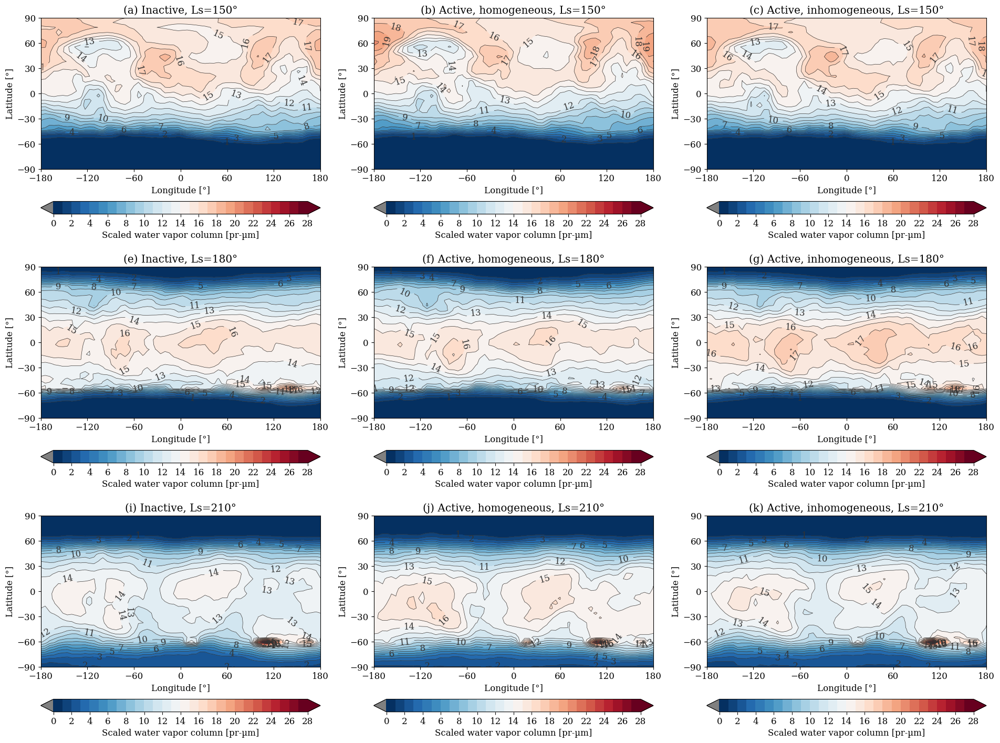

In [7]:
titles = [
    '(a) Inactive, Ls=150°',
    '(b) Active, homogeneous, Ls=150°',
    '(c) Active, inhomogeneous, Ls=150°',
#    '(d) TES observations, Ls=150°',
    '(e) Inactive, Ls=180°',
    '(f) Active, homogeneous, Ls=180°',
    '(g) Active, inhomogeneous, Ls=180°',
#    '(h) TES observations, Ls=180°',
    '(i) Inactive, Ls=210°',
    '(j) Active, homogeneous, Ls=210°',
    '(k) Active, inhomogeneous, Ls=210°',
#    '(l) TES observations, Ls=210°',
]
Z = scaled_wv
levels = [
    np.arange(0,28.1,1),
    np.arange(0,28.1,1),
    np.arange(0,28.1,1),
]
labels = [
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
]


ncols,nrows=3,3
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]

    cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under('0.5')
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i,:,:],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::2], 
    ).set_label(
        labels[j]
    )
    cs = ax.contour(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i,:,:],
        colors='0.2', linewidths=0.5, levels=levels[j]
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title(titles[i])
plt.show()

In [8]:
import netCDF4
nc = netCDF4.Dataset('TES/NetCDF/TES.MappedClimatology.nadir.MY26.nc', 'r')
nc.set_auto_mask(False)
print('nc.variables.keys() = ', nc.variables.keys())

longitude = nc.variables['longitude'][:]
latitude = nc.variables['latitude'][:]
water_vapor = nc.variables['water_vapor'][:]
Psurf_day = nc.variables['Psurf_day'][:]
Tsurf_day = nc.variables['Tsurf_day'][:]
tau_ice = nc.variables['tau_ice'][:]
print('longitude.shape = ', longitude.shape)
print('latitude.shape = ', latitude.shape)
print('water_vapor.shape = ', water_vapor.shape)
print('Psurf_day.shape = ', Psurf_day.shape)
print('Tsurf_day.shape = ', Tsurf_day.shape)

normalized_wv_TES = water_vapor/(Psurf_day/6.10)

nc.variables.keys() =  dict_keys(['longitude', 'latitude', 'altitude', 'time', 'tau_dust', 'tau_ice', 'water_vapor', 'Psurf_day', 'Psurf_nit', 'Tsurf_day', 'Tsurf_nit', 'T_nadir_day', 'T_nadir_nit'])
longitude.shape =  (48,)
latitude.shape =  (60,)
water_vapor.shape =  (72, 60, 48)
Psurf_day.shape =  (72, 60, 48)
Tsurf_day.shape =  (72, 60, 48)


k,j,i =  0 0 0


k,j,i =  0 1 1
k,j,i =  0 2 2


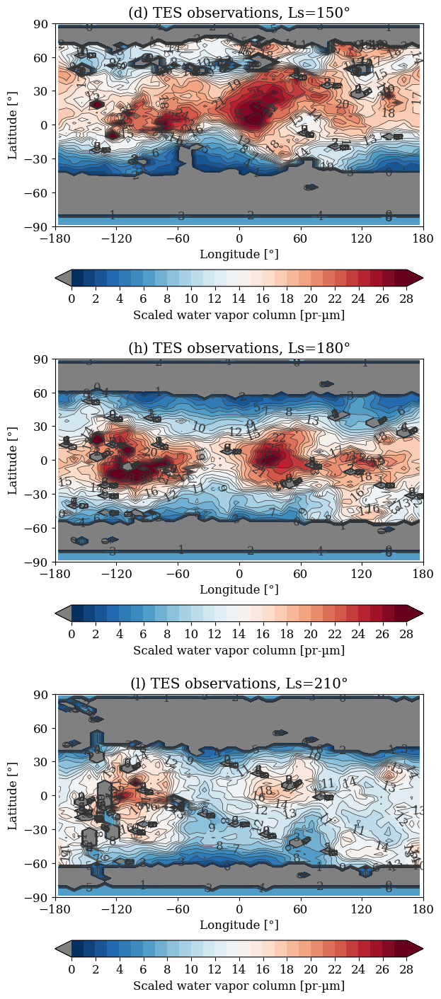

In [10]:
titles = [
#    '(a) Inactive, Ls=150°',
#    '(b) Active, homogeneous, Ls=150°',
#    '(c) Active, inhomogeneous, Ls=150°',
    '(d) TES observations, Ls=150°',
#    '(e) Inactive, Ls=180°',
#    '(f) Active, homogeneous, Ls=180°',
#    '(g) Active, inhomogeneous, Ls=180°',
    '(h) TES observations, Ls=180°',
#    '(i) Inactive, Ls=210°',
#    '(j) Active, homogeneous, Ls=210°',
#    '(k) Active, inhomogeneous, Ls=210°',
    '(l) TES observations, Ls=210°',
]
Z = [
    normalized_wv_TES[int(150/5),:,:],
    normalized_wv_TES[int(180/5),:,:],
    normalized_wv_TES[int(210/5),:,:],
]
levels = [
    np.arange(0,28.1,1),
    np.arange(0,28.1,1),
    np.arange(0,28.1,1),
]
labels = [
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
]


ncols,nrows=1,3
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]

    cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under('0.5')
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        longitude, latitude, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::2], 
    ).set_label(
        labels[j]
    )
    cs = ax.contour(
        longitude, latitude, Z[i],
        colors='0.2', linewidths=0.5, levels=levels[j]
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title(titles[i])
plt.show()

In [10]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
]
variables = [
    'TG-1h',
    'wgv2-1h',
    'wga2-1h',
    'wgi2-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,20,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/TG-1h.asc


/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/wgv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/wga2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/wgi2-1h.asc
(1, 4, 10, 24, 20, 32, 64)


In [11]:
deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°
#data_local_ave_zm = zonal_mean(data_local_ave) # zonal mean

difference = np.empty_like(data_local_ave)
for i in range(nt):
    difference[:,:,i,:,:,:] = data_local_ave[:,:,i,:,:,:] - data_local_ave[:,:,12,:,:,:]

-52.09677419354839
-24.67741935483871
2.741935483870961
24.677419354838705
52.096774193548384
k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2
k,j,i =  3 0 3
k,j,i =  4 0 4
k,j,i =  0 1 5
k,j,i =  1 1 6
k,j,i =  2 1 7
k,j,i =  3 1 8
k,j,i =  4 1 9
k,j,i =  0 2 10
k,j,i =  1 2 11
k,j,i =  2 2 12
k,j,i =  3 2 13
k,j,i =  4 2 14


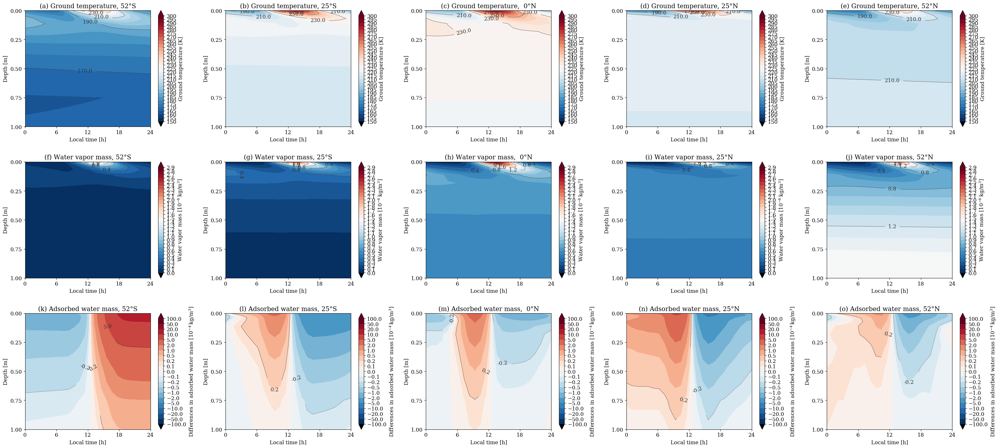

In [12]:
ncols,nrows=5,3
levels = [
    np.arange(150,300.1,5),
    np.arange(0,3,0.1),
    [-100,-50,-20,-10,-5,-2,-1,-0.5,-0.2,-0.1,0,0.1,0.2,0.5,1,2,5,10,20,50,100]
]
lon=0
latitudes = np.linspace(-85,85,32)[::-1]
print(latitudes[16+9])
print(latitudes[16+4])
print(latitudes[15])
print(latitudes[15-4])
print(latitudes[15-9])
Z = [
    data_local_ave[0,0,:,:,16+9,lon].T,
    data_local_ave[0,0,:,:,16+4,lon].T,
    data_local_ave[0,0,:,:,15  ,lon].T,
    data_local_ave[0,0,:,:,15-4,lon].T,
    data_local_ave[0,0,:,:,15-9,lon].T,

    data_local_ave[0,1,:,:,16+9,lon].T*1e6,
    data_local_ave[0,1,:,:,16+4,lon].T*1e6,
    data_local_ave[0,1,:,:,15  ,lon].T*1e6,
    data_local_ave[0,1,:,:,15-4,lon].T*1e6,
    data_local_ave[0,1,:,:,15-9,lon].T*1e6,

    difference[0,2,:,:,16+9,lon].T*1e4 + difference[0,3,:,:,16+9,lon].T*1e4,
    difference[0,2,:,:,16+4,lon].T*1e4 + difference[0,3,:,:,16+4,lon].T*1e4,
    difference[0,2,:,:,15  ,lon].T*1e4 + difference[0,3,:,:,15  ,lon].T*1e4,
    difference[0,2,:,:,15-4,lon].T*1e4 + difference[0,3,:,:,15-4,lon].T*1e4,
    difference[0,2,:,:,15-9,lon].T*1e4 + difference[0,3,:,:,15-9,lon].T*1e4,
]
labels = [
    r'Ground temperature [K]',
    r'Water vapor mass [$10^{-6} \,\rm kg/m^3$]',
    r'Differences in adsorbed water mass [$10^{-4} \,\rm kg/m^3$]',
]
titles = [
    '(a) Ground temperature, 52°S',
    '(b) Ground temperature, 25°S',
    '(c) Ground temperature,  0°N',
    '(d) Ground temperature, 25°N',
    '(e) Ground temperature, 52°N',
    '(f) Water vapor mass, 52°S',
    '(g) Water vapor mass, 25°S',
    '(h) Water vapor mass,  0°N',
    '(i) Water vapor mass, 25°N',
    '(j) Water vapor mass, 52°N',
    '(k) Adsorbed water mass, 52°S',
    '(l) Adsorbed water mass, 25°S',
    '(m) Adsorbed water mass,  0°N',
    '(n) Adsorbed water mass, 25°N',
    '(o) Adsorbed water mass, 52°N',
]

plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under()
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)
    mappable = ax.contourf(
        np.linspace(0,24,24), layers, Z[i],
        extend='both', cmap=cmap, levels=levels[j], norm=norm
    )
    plt.colorbar(mappable, ax=ax, ticks=levels[j],
    ).set_label(labels[j])
    cs = ax.contour(
        np.linspace(0,24,24), layers, Z[i],
        colors='0.2', linewidths=0.5, levels=levels[j][::4]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )
    ax.set_ylim(0,1)
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(0,24,5))
    ax.set_yticks(np.linspace(0,1,5))
    ax.set_xlabel('Local time [h]')
    ax.set_ylabel('Depth [m]')
    ax.set_title(titles[i])
#plt.savefig('draw_map_'+titles[k]+'.pdf', dpi=300)
plt.show()

In [13]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/',
]
variables = [
    'wgv2',
    'wga2',
    'wgi2',
    'wgv2c',
    'wga2c',
    'wgi2c',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),1,1,20,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_roll = roll_longitude(data,nx)
data_zm = zonal_mean(data)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wgv2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wga2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wgi2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wgv2c.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wga2c.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-ads46.20/wgi2c.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wgv2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wga2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wgi2.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wgv2c.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wga2c.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-spinup-adsinhom/wgi2c.asc
(2, 6, 1, 1, 20, 32, 64)


k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  0 1 2
k,j,i =  1 1 3


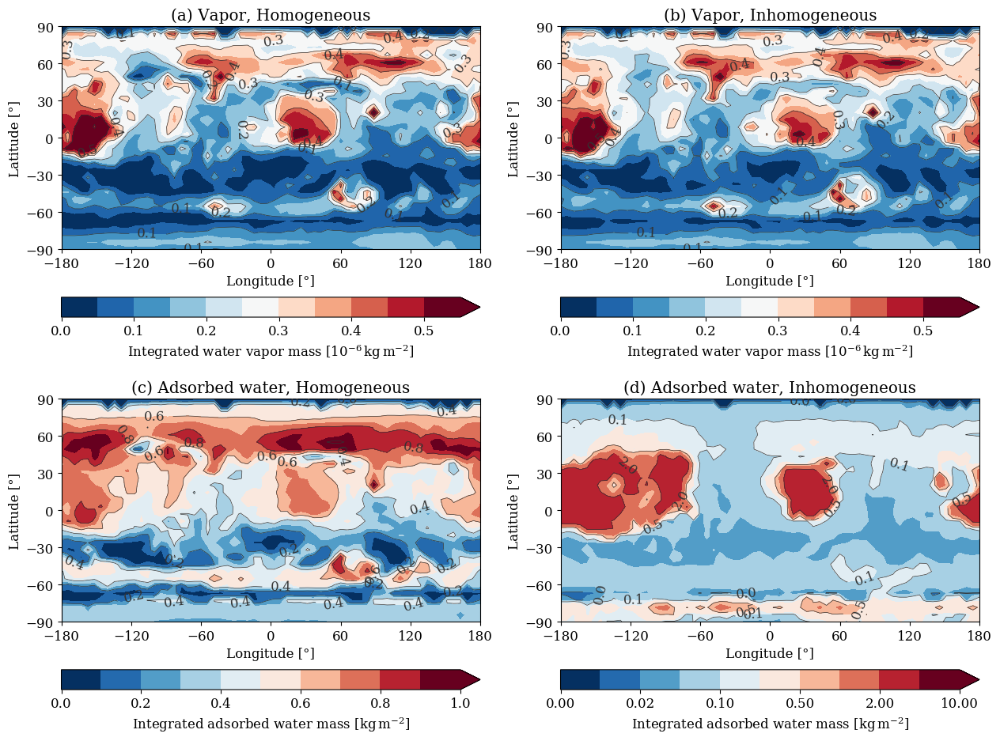

In [14]:
layers = [
#0.000000, 
0.001000, 0.002600,
0.005160, 0.009256, 0.015810,
0.026295, 0.043073, 0.069916,
0.112866, 0.181585, 0.291536,
0.467458, 0.748933, 1.199293,
1.919869, 3.072791, 4.917465,
7.868944, 12.591311, 20.147097
]
Z = [
    data_roll[0,3,0,0,13,:,:],
    data_roll[1,3,0,0,13,:,:],
    data_roll[0,4,0,0,13,:,:],
    data_roll[1,4,0,0,13,:,:],
]
factors = [1e6,1,1]
labels = [
    r'Integrated water vapor mass [$10^{-6} \rm \,kg \,m^{-2}$]',
    r'Integrated adsorbed water mass [$\rm kg \,m^{-2}$]',
#    r'Integrated pore ice mass [$\rm kg \,m^{-3}$]',
]
levels = [
    np.arange(0,0.6,0.05),
    np.arange(0,0.6,0.05),
    np.arange(0,1.1,0.1),
    [0,0.01,0.02,0.05,0.1,0.2,0.5,1,2,5,10],
#    [0,0.01,0.02,0.05,0.1,0.2,0.5,0.6,0.7,0.8,0.9,1,2,5,10,20,50,100],
]
titles = [
    '(a) Vapor, Homogeneous',
    '(b) Vapor, Inhomogeneous',
    '(c) Adsorbed water, Homogeneous',
    '(d) Adsorbed water, Inhomogeneous',
#    '(e) Pore ice, Homogeneous',
#    '(f) Pore ice, Inhomogeneous',
]

ncols,nrows=2,2
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    norm = colors.BoundaryNorm(levels[i], ncolors=cmap.N)
    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,ny)[::-1], Z[i]*factors[j],
        extend='max', cmap=cmap, 
        levels=levels[i], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[i][::2],
    ).set_label(labels[j])
    cs = ax.contour(
        np.linspace(-180,180,nx), np.linspace(-90,90,ny)[::-1], Z[i]*factors[j],
        colors='0.2', linewidths=0.5, 
        levels=levels[i][::2]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )
    #ax.minorticks_on()
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title(titles[i])
plt.show()

k,j,i =  0 0 0
k,j,i =  1 0 1


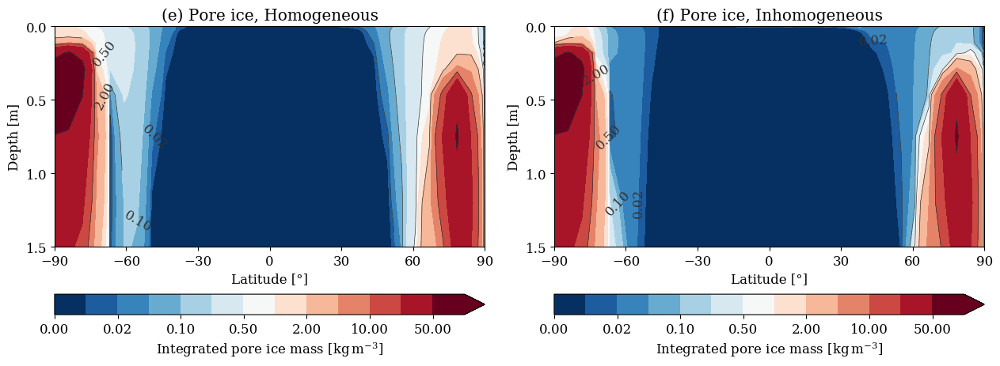

In [15]:
labels = [
#    r'Integrated water vapor mass [$10^{-6} \rm \,kg \,m^{-3}$]',
#    r'Integrated adsorbed water mass [$\rm kg \,m^{-3}$]',
    r'Integrated pore ice mass [$\rm kg \,m^{-3}$]',
]
levels = [
#    np.arange(0,0.6,0.05),
#    np.arange(0,0.6,0.05),
#    np.arange(0,1.1,0.1),
#    [0,0.01,0.02,0.05,0.1,0.2,0.5,1,2,5,10],
    [0,0.01,0.02,0.05,0.1,0.2,0.5,1,2,5,10,20,50,100],
    [0,0.01,0.02,0.05,0.1,0.2,0.5,1,2,5,10,20,50,100],
]

titles = [
#    '(a) Vapor, Homogeneous',
#    '(b) Vapor, Inhomogeneous',
#    '(c) Adsorbed water, Homogeneous',
#    '(d) Adsorbed water, Inhomogeneous',
    '(e) Pore ice, Homogeneous',
    '(f) Pore ice, Inhomogeneous',
]
Z = [
    data_zm[0,2,0,0,:,:],
    data_zm[1,2,0,0,:,:],
]

ncols,nrows=2,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    norm = colors.BoundaryNorm(levels[i], ncolors=cmap.N)
    mappable = ax.contourf(
        np.linspace(-90,90,32)[::-1], layers, Z[i],
        extend='max', cmap=cmap, 
        levels=levels[i], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[i][::2],
    ).set_label(labels[j])
    cs = ax.contour(
        np.linspace(-90,90,32)[::-1], layers, Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[i][::2]
    )
    ax.clabel(
        cs, fmt='%1.2f'
    )
    #ax.minorticks_on()
    ax.set_ylim(0,1.5)
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-90,90,7))
    ax.set_yticks(np.linspace(0,1.5,4))
    ax.set_xlabel('Latitude [°]')
    ax.set_ylabel('Depth [m]')
    ax.set_title(titles[i])
plt.show()

In [16]:
m = [0,0.01,0.02,0.05,0.1,0.2,0.5,1,2,5,10]
wt = np.zeros_like(m)
for i in range(len(m)):
    wt[i] = round(100*m[i]/(m[i]+1500),4)
print(wt)

[0.     0.0007 0.0013 0.0033 0.0067 0.0133 0.0333 0.0666 0.1332 0.3322
 0.6623]


In [2]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/',
]
variables = [
    'wflux2s-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_zm = zonal_mean(data_local)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/wflux2s-1h.asc


(1, 1, 669, 24, 1, 32, 64)


In [3]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/',
]
variables = [
    'wflux2s',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,1,1,32,64
wflux2s = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        wflux2s[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
wflux2s = wflux2s.reshape(nf,nv,nd,nt,nz,ny,nx)
print(wflux2s.shape)

deg = 5.625
wflux2s_local = localtime_aligner(wflux2s,nx,deg) # Synchronize local time at all locations
wflux2s_local_zm = zonal_mean(wflux2s_local)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/wflux2s.asc
(1, 1, 669, 1, 1, 32, 64)


k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2


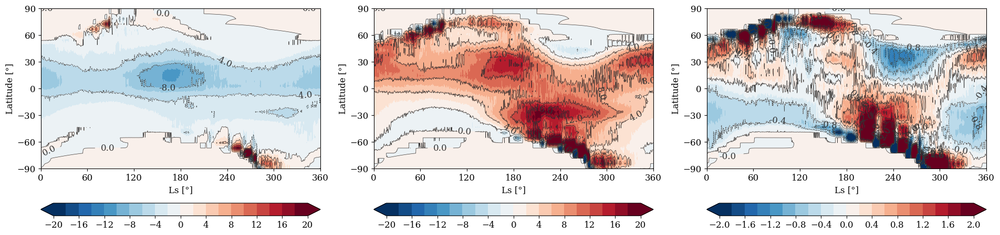

In [5]:
Z = [
    data_local_zm[0,0,:,8,0,:].T *1e9,
    data_local_zm[0,0,:,12,0,:].T*1e9,
    wflux2s_local_zm[0,0,:,0,0,:].T*1e9,
]
levels = [
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
    np.arange(-2,2.1,0.2),
]
labels = [
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
]
titles = [
    '(a) Active, Inhomogeneous, at 8 am',
    '(b) Active, Inhomogeneous, at noon',
    '(c) Active, Inhomogeneous, Diurnal mean',
]

ncols,nrows=3,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    norm = colors.BoundaryNorm(levels[i], ncolors=cmap.N)
    mappable = ax.contourf(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[i], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[i][::2],
    #).set_label(labels[j]
    )
    cs = ax.contour(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[i][::2]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )
    ax.set_xticks(np.linspace(0,360,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Ls [°]')
    ax.set_ylabel('Latitude [°]')
    #ax.set_title (titles[i])
plt.show()

/tmp/ipykernel_2222539/2358432827.py:8: RuntimeWarning: divide by zero encountered in true_divide
  G = R * Tg / M * K_0 * np.exp(-H / (R * Tg))


k,j,i =  0 0 0


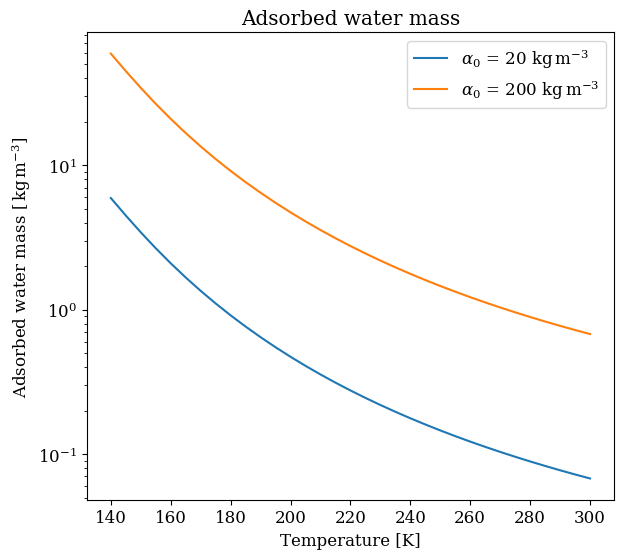

In [49]:
alpha_0 = 20 # kg/m3
R = 8.314
Tg = np.arange(140.,300.1,5.) # K
M = 18.01528e-3 # kg/mol
K_0 = 1.57e-8
H = -21.38163e3 # J/mol
n = 1e-6
G = R * Tg / M * K_0 * np.exp(-H / (R * Tg))
alpha1 = alpha_0 * np.sqrt(G*n / (1. + G*n))

alpha_0 = 200 # kg/m3
alpha2 = alpha_0 * np.sqrt(G*n / (1. + G*n))

ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows*1.2]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    ax.plot(Tg,alpha1, label=r'$\alpha_0$ = 20 $\rm kg \,m^{-3}$')
    ax.plot(Tg,alpha2, label=r'$\alpha_0$ = 200 $\rm kg \,m^{-3}$')
    ax.legend()
#    ax.set_ylim(0,20)
    ax.set_yscale('log')
    ax.set_xlabel(r'Temperature [K]')
    ax.set_ylabel(r'Adsorbed water mass [$\rm \,kg \,m^{-3}$]')
    ax.set_title('Adsorbed water mass')
plt.show()

k,j,i =  0 0 0


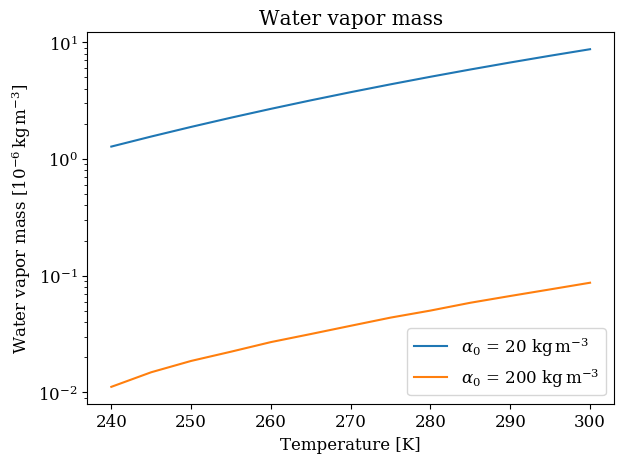

In [ ]:
#alpha_0 = 20 # kg/m3
#R = 8.314
#Tg = np.arange(240.,300.1,5., dtype='float') # K
#M = 18.01528e-3 # kg/mol
#K_0 = 1.57e-8
#H = -21.38163e3 # J/mol
#G = R * Tg / M * K_0 * np.exp(-H / (R * Tg))
#m = 0.2
#phi = 0.3
#
#a = 1
#b = -2 * m / phi - G * alpha_0**2 / phi**2
#c = m**2 / phi**2
## 判別式の丸め誤差対策
#D = np.maximum(b**2 - 4 * a * c, 0)
## 小さい方の根を採用
#n1 = (-b - np.sqrt(D)) / (2 * a)
#
#alpha_0 = 200 # kg/m3
#a = 1
#b = -2 * m / phi - G * alpha_0**2 / phi**2
#c = m**2 / phi**2
## 判別式の丸め誤差対策
#D = np.maximum(b**2 - 4 * a * c, 0)
## 小さい方の根を採用
#n2 = (-b - np.sqrt(D)) / (2 * a)
#
#ncols,nrows=1,1
#plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
#fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
#for i in range(ncols*nrows):
#    k,j=i%ncols,int(i/ncols)
#    print('k,j,i = ', k,j,i)
#    if (ncols==1 and nrows==1):
#        ax=axes
#    elif (ncols==1):
#        ax=axes[j]
#    elif (nrows==1):
#        ax=axes[k]
#    else:
#        ax=axes[j,k]
#    ax.plot(Tg,n1*1e6, label=r'$\alpha_0$ = 20 $\rm kg \,m^{-3}$')
#    ax.plot(Tg,n2*1e6, label=r'$\alpha_0$ = 200 $\rm kg \,m^{-3}$')
#    ax.legend()
#    ax.set_yscale('log')
#    ax.set_xlabel(r'Temperature [K]')
#    ax.set_ylabel(r'Water vapor mass [$10^{-6} \rm \,kg \,m^{-3}$]')
#    ax.set_title('Water vapor mass')
#plt.show()

In [138]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/',
]
variables = [
    'TS-1h',
    'wgv2-1h',
    'wga2-1h',
    'wflux2s-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/TS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/wgv2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/wga2-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/wflux2s-1h.asc
(1, 4, 669, 24, 1, 32, 64)


In [130]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/',
]
variables = [
    'ads0',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,1,1,32,64
ads0 = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        ads0[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
ads0 = ads0.reshape(nf,nv,nd,nt,nz,ny,nx)
print(ads0.shape)

lat,lon = 15,0
print(ads0[0,0,0,0,0,lat,lon])

lat,lon = 15,5
print(ads0[0,0,0,0,0,lat,lon])

#ncols,nrows=1,1
#plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
#fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
#for i in range(ncols*nrows):
#    k,j=i%ncols,int(i/ncols)
#    print('k,j,i = ', k,j,i)
#    if (ncols==1 and nrows==1):
#        ax=axes
#    elif (ncols==1):
#        ax=axes[j]
#    elif (nrows==1):
#        ax=axes[k]
#    else:
#        ax=axes[j,k]
#    ax.contourf(
#        ads0[0,0,0,0,0,:,:],
#    )
#plt.show()

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/ads0.asc


(1, 1, 669, 1, 1, 32, 64)
6.2178
181.98


param =  [ 0.04288593 -9.92702639]
param =  [ 0.03692612 -8.94409281]
k,j,i =  0 0 0


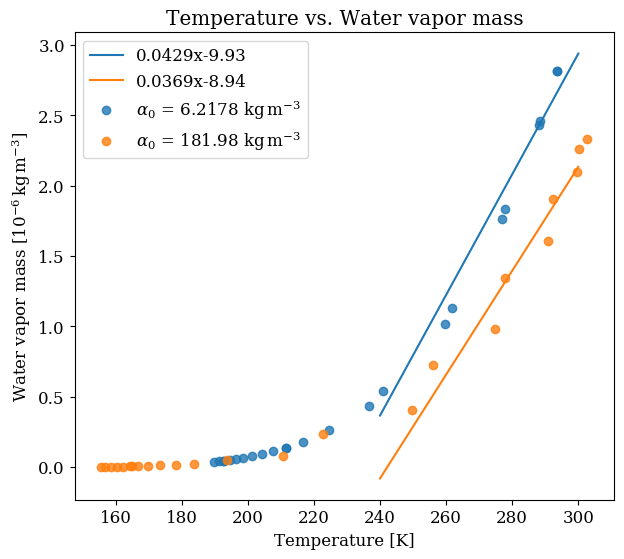

k,j,i =  0 0 0


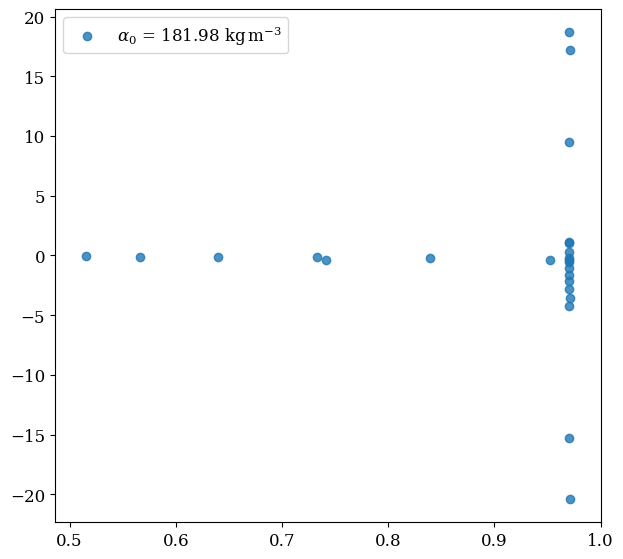

In [142]:
deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
#print(data_local[0,0,:,0,0,lat,lon])
#print(data_local[0,1,:,0,0,lat,lon])
#print(data_local[0,2,:,0,0,lat,lon])

Ls = 317
Ls = 371
#Ls = 421

from scipy.optimize import curve_fit
#近似する式を定義
def nonlinear_fit(x,a,b):
    return a*x + b
#curve fittingの実施
param1, cov = curve_fit(nonlinear_fit, data_local[0,0,Ls,8:16,0,lat,0], data_local[0,1,Ls,8:16,0,lat,0]*1e6)
param2, cov = curve_fit(nonlinear_fit, data_local[0,0,Ls,8:16,0,lat,5], data_local[0,1,Ls,8:16,0,lat,5]*1e6)
print('param = ', param1)
print('param = ', param2)

ts = np.arange(240.,300.1,5.)

ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows*1.2]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    ax.scatter(data_local[0,0,Ls,:,0,lat,0], data_local[0,1,Ls,:,0,lat,0]*1e6, alpha=0.8, label=r'$\alpha_0$ = 6.2178 $\rm kg \,m^{-3}$')
    ax.scatter(data_local[0,0,Ls,:,0,lat,5], data_local[0,1,Ls,:,0,lat,5]*1e6, alpha=0.8, label=r'$\alpha_0$ = 181.98 $\rm kg \,m^{-3}$')
    ax.plot(ts, param1[0]*ts + param1[1], label=str(f"{param1[0]:.3}")+'x'+str(f"{param1[1]:.3}"))
    ax.plot(ts, param2[0]*ts + param2[1], label=str(f"{param2[0]:.3}")+'x'+str(f"{param2[1]:.3}"))
    ax.set_xlabel(r'Temperature [K]')
    ax.set_ylabel(r'Water vapor mass [$10^{-6} \rm \,kg \,m^{-3}$]')
    ax.set_title('Temperature vs. Water vapor mass')
#    ax.set_yscale('log')
    ax.legend()
plt.show()

#ncols,nrows=1,1
#plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
#fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
#for i in range(ncols*nrows):
#    k,j=i%ncols,int(i/ncols)
#    print('k,j,i = ', k,j,i)
#    if (ncols==1 and nrows==1):
#        ax=axes
#    elif (ncols==1):
#        ax=axes[j]
#    elif (nrows==1):
#        ax=axes[k]
#    else:
#        ax=axes[j,k]
#    ax.scatter(data_local[0,1,317,:,0,lat,0]*1e6, data_local[0,2,317,:,0,lat,0], alpha=0.8, label=r'$\alpha_0$ = 6.2178 $\rm kg \,m^{-3}$')
#    ax.scatter(data_local[0,1,317,:,0,lat,5]*1e6, data_local[0,2,317,:,0,lat,5], alpha=0.8, label=r'$\alpha_0$ = 181.98 $\rm kg \,m^{-3}$')
#    ax.set_xlabel(r'Water vapor mass [$10^{-6} \rm \,kg \,m^{-3}$]')
#    ax.set_ylabel(r'Adsorbed water mass [$\rm \,kg \,m^{-3}$]')
#    ax.set_title('Water vapor mass vs. Adsorbed water mass')
#    ax.set_yscale('log')
#    ax.legend()
#plt.show()

ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows*1.2]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
#    ax.scatter(data_local[0,0,Ls,10:16,0,lat,0], data_local[0,2,Ls,10:16,0,lat,0]*1e9, alpha=0.8, label=r'$\alpha_0$ = 6.2178 $\rm kg \,m^{-3}$')
#    ax.scatter(data_local[0,0,Ls,10:16,0,lat,5], data_local[0,2,Ls,10:16,0,lat,5]*1e9, alpha=0.8, label=r'$\alpha_0$ = 181.98 $\rm kg \,m^{-3}$')
#    ax.scatter(data_local[0,1,Ls,10:16,0,lat,0]*1e6, data_local[0,2,Ls,10:16,0,lat,0]*1e9, alpha=0.8, label=r'$\alpha_0$ = 6.2178 $\rm kg \,m^{-3}$')
#    ax.scatter(data_local[0,1,Ls,10:16,0,lat,5]*1e6, data_local[0,2,Ls,10:16,0,lat,5]*1e9, alpha=0.8, label=r'$\alpha_0$ = 181.98 $\rm kg \,m^{-3}$')
#    ax.scatter(data_local[0,2,Ls,:,0,lat,0], data_local[0,3,Ls,:,0,lat,0]*1e9, alpha=0.8, label=r'$\alpha_0$ = 6.2178 $\rm kg \,m^{-3}$')
    ax.scatter(data_local[0,2,Ls,:,0,lat,5], data_local[0,3,Ls,:,0,lat,5]*1e9, alpha=0.8, label=r'$\alpha_0$ = 181.98 $\rm kg \,m^{-3}$')
#    ax.set_xlabel(r'Temperature [K]')
#    ax.set_ylabel(r'Water vapor mass [$10^{-6} \rm \,kg \,m^{-3}$]')
#    ax.set_title('Temperature vs. Water vapor mass')
#    ax.set_yscale('log')
    ax.legend()
plt.show()

In [ ]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/',
]
variables = [
    'wflux2s-1h',
#    'U-1h',
#    'V-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_zm = zonal_mean(data_local)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/wflux2s-1h.asc


KeyboardInterrupt: 

k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2
k,j,i =  0 1 3
k,j,i =  1 1 4
k,j,i =  2 1 5
k,j,i =  0 2 6
k,j,i =  1 2 7
k,j,i =  2 2 8


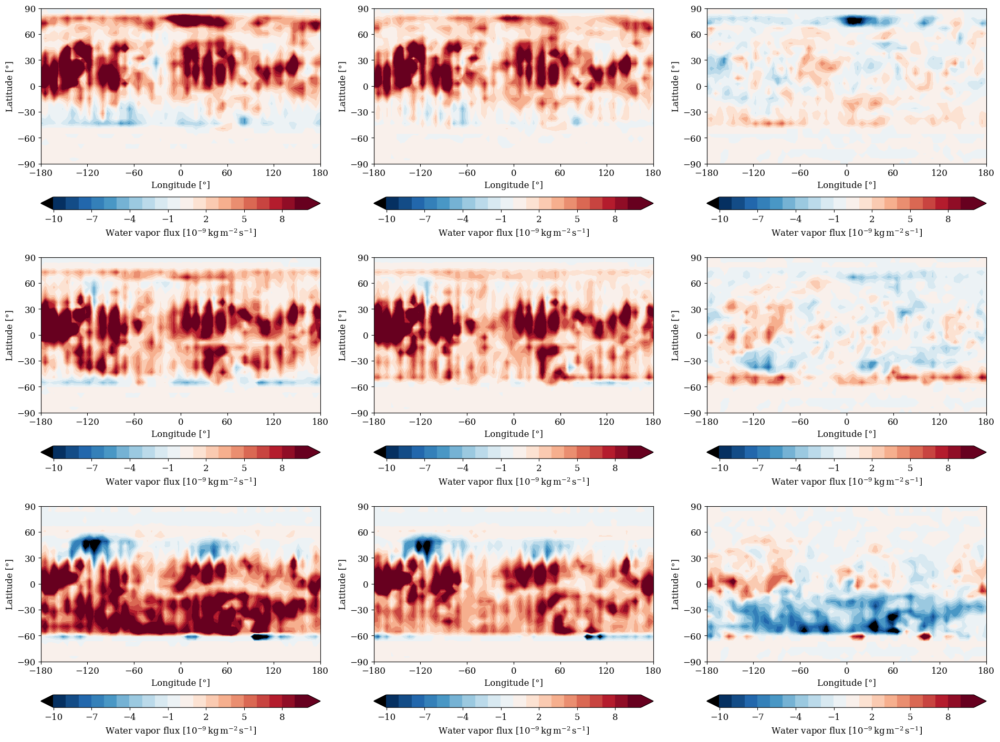

In [ ]:
#data_local_ave = day_average(data_local) # 10 days average
data_local_roll = roll_longitude(data_local,nx) # roll longitudes 180°

Z = [
    np.average(data_local_roll[0,0,317:328,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,317:328,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,317:328,10,0,:,:], axis=0)*1e9-np.average(data_local_roll[0,0,317:328,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[0,0,371:382,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,371:382,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,371:382,10,0,:,:], axis=0)*1e9-np.average(data_local_roll[0,0,371:382,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[0,0,421:432,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,421:432,10,0,:,:], axis=0)*1e9,
    np.average(data_local_roll[1,0,421:432,10,0,:,:], axis=0)*1e9-np.average(data_local_roll[0,0,421:432,10,0,:,:], axis=0)*1e9,
]

levels = [
    np.arange(-10,10.1,1),
    np.arange(-10,10.1,1),
    np.arange(-10,10.1,1),

    np.arange(-30,30.1,2),
    np.arange(-30,30.1,2),
    np.arange(-30,30.1,2),
]
titles = [
    '(a) Active, Homogeneous, Ls=150°',
    '(b) Active, Inhomogeneous, Ls=150°',
    '(c) Active, Homogeneous, Ls=180°',
    '(d) Active, Inhomogeneous, Ls=180°',
    '(e) Active, Homogeneous, Ls=210°',
    '(f) Active, Inhomogeneous, Ls=210°',
]


ncols,nrows=3,3
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under()
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::3],
    ).set_label(labels[j]
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    #ax.set_title(titles[i])
plt.show()

In [18]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/',
]
variables = [
    'wflux2s',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,1,1,32,64
wflux2s = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        wflux2s[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
wflux2s = wflux2s.reshape(nf,nv,nd,nt,nz,ny,nx)
print(wflux2s.shape)

deg = 5.625
wflux2s_local = localtime_aligner(wflux2s,nx,deg) # Synchronize local time at all locations
wflux2s_local_zm = zonal_mean(wflux2s_local)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/wflux2s.asc


(1, 1, 669, 1, 1, 32, 64)


k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2
k,j,i =  3 0 3
k,j,i =  4 0 4


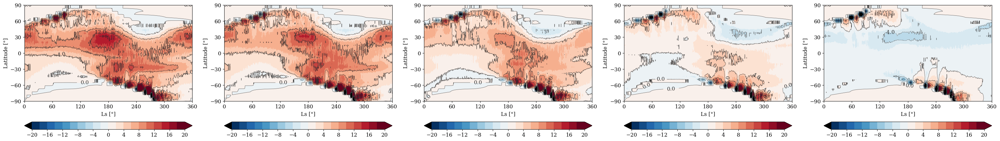

In [21]:
Z = [
#    data_local_zm[0,0,:,8,0,:].T *1e9,
    data_local_zm[0,0,:,12,0,:].T*1e9,
    data_local_zm[0,0,:,13,0,:].T*1e9,
    data_local_zm[0,0,:,14,0,:].T*1e9,
    data_local_zm[0,0,:,15,0,:].T*1e9,
    data_local_zm[0,0,:,16,0,:].T*1e9,
#    wflux2s_local_zm[0,0,:,0,0,:].T*1e9,
]
levels = [
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
#    np.arange(-2,2.1,0.2),
]
labels = [
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
]
titles = [
    '(a) Active, Inhomogeneous, at 8 am',
    '(b) Active, Inhomogeneous, at noon',
    '(c) Active, Inhomogeneous, Diurnal mean',

]

ncols,nrows=5,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    norm = colors.BoundaryNorm(levels[i], ncolors=cmap.N)
    mappable = ax.contourf(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[i], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[i][::2],
    #).set_label(labels[j]
    )
    cs = ax.contour(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[i][::2]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )
    ax.set_xticks(np.linspace(0,360,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Ls [°]')
    ax.set_ylabel('Latitude [°]')
    #ax.set_title (titles[i])
plt.show()

k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2


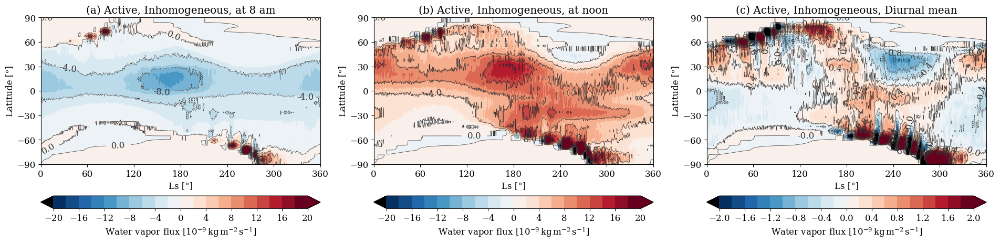

In [22]:
Z = [
    data_local_zm[0,0,:,8,0,:].T *1e9,
    data_local_zm[0,0,:,12,0,:].T*1e9,
    wflux2s_local_zm[0,0,:,0,0,:].T*1e9,
]
levels = [
    np.arange(-20,20.1,2),
    np.arange(-20,20.1,2),
    np.arange(-2,2.1,0.2),
]
labels = [
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
    r'Water vapor flux [$10^{-9} \rm \,kg \,m^{-2} \,s^{-1}$]',
]
titles = [
    '(a) Active, Inhomogeneous, at 8 am',
    '(b) Active, Inhomogeneous, at noon',
    '(c) Active, Inhomogeneous, Diurnal mean',

]

ncols,nrows=3,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    norm = colors.BoundaryNorm(levels[i], ncolors=cmap.N)
    mappable = ax.contourf(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[i], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[i][::2],
    ).set_label(labels[j]
    )
    cs = ax.contour(
        Ls, np.linspace(-90,90,ny)[::-1], Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[i][::2]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )
    ax.set_xticks(np.linspace(0,360,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Ls [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title (titles[i])
plt.show()

In [157]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/',
]
variables = [
    'wflux2s-12h-1d',
    'U-12h-1d',
    'V-12h-1d',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,1,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

data_roll = roll_longitude(data,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/wflux2s-12h-1d.asc


/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/U-12h-1d.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-ads46.20/Localtime/V-12h-1d.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/wflux2s-12h-1d.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/U-12h-1d.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/Localtime/V-12h-1d.asc
(2, 3, 669, 1, 1, 32, 64)


k,j,i =  0 0 0
k,j,i =  1 0 1
k,j,i =  2 0 2
k,j,i =  0 1 3
k,j,i =  1 1 4
k,j,i =  2 1 5


k,j,i =  0 2 6
k,j,i =  1 2 7
k,j,i =  2 2 8


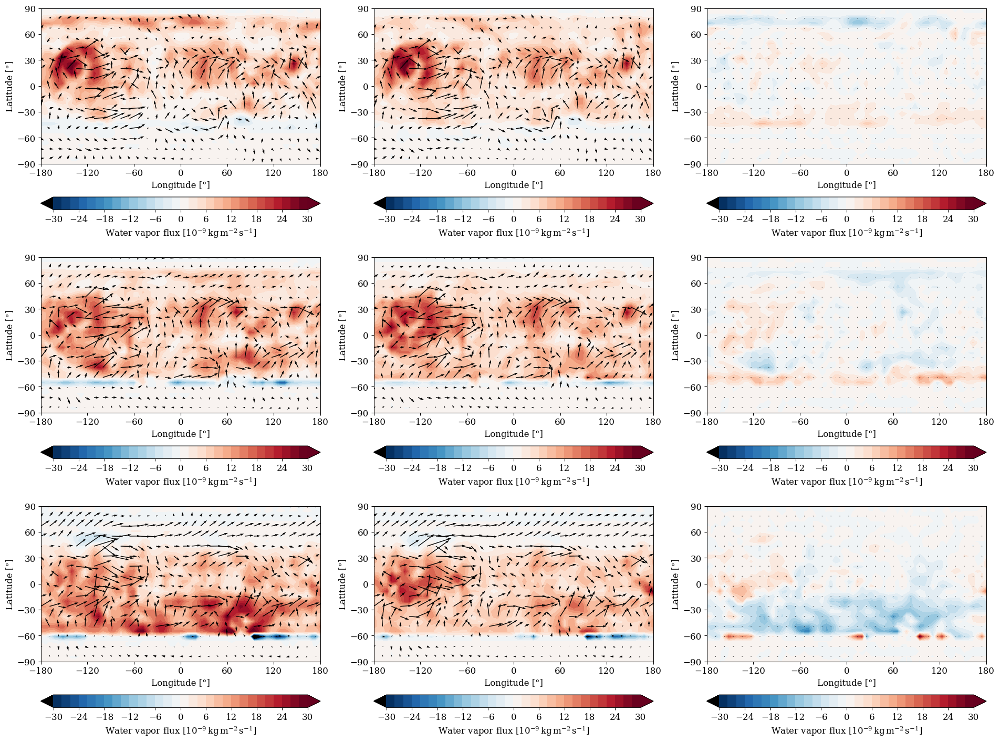

In [161]:
Z = [
    np.average(data_roll[0,0,317:328,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,317:328,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,317:328,0,0,:,:], axis=0)*1e9 - np.average(data_roll[0,0,317:328,0,0,:,:], axis=0)*1e9,

    np.average(data_roll[0,0,371:382,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,371:382,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,371:382,0,0,:,:], axis=0)*1e9 - np.average(data_roll[0,0,371:382,0,0,:,:], axis=0)*1e9,

    np.average(data_roll[0,0,421:432,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,421:432,0,0,:,:], axis=0)*1e9,
    np.average(data_roll[1,0,421:432,0,0,:,:], axis=0)*1e9 - np.average(data_roll[0,0,421:432,0,0,:,:], axis=0)*1e9,

]

#U = data_roll[:,1,:,:,:,:,:]
#V = data_roll[:,2,:,:,:,:,:]
#wind_velocity = np.sqrt(U**2 + V**2)

U = [
    np.average(data_roll[0,1,317:328,0,0,:,:], axis=0),
    np.average(data_roll[1,1,317:328,0,0,:,:], axis=0),
    np.zeros((32,64)),
    np.average(data_roll[0,1,371:382,0,0,:,:], axis=0),
    np.average(data_roll[1,1,371:382,0,0,:,:], axis=0),
    np.zeros((32,64)),
    np.average(data_roll[0,1,421:432,0,0,:,:], axis=0),
    np.average(data_roll[1,1,421:432,0,0,:,:], axis=0),
    np.zeros((32,64)),
]
V = [
    np.average(data_roll[0,2,317:328,0,0,:,:], axis=0),
    np.average(data_roll[1,2,317:328,0,0,:,:], axis=0),
    np.zeros((32,64)),
    np.average(data_roll[0,2,371:382,0,0,:,:], axis=0),
    np.average(data_roll[1,2,371:382,0,0,:,:], axis=0),
    np.zeros((32,64)),
    np.average(data_roll[0,2,421:432,0,0,:,:], axis=0),
    np.average(data_roll[1,2,421:432,0,0,:,:], axis=0),
    np.zeros((32,64)),
]
levels = [
    np.arange(-30,30.1,2),
    np.arange(-30,30.1,2),
    np.arange(-30,30.1,2),
]
titles = [
    '(a) Active, Homogeneous, Ls=150°',
    '(b) Active, Inhomogeneous, Ls=150°',
    '(c) Active, Homogeneous, Ls=180°',
    '(d) Active, Inhomogeneous, Ls=180°',
    '(e) Active, Homogeneous, Ls=210°',
    '(f) Active, Inhomogeneous, Ls=210°',
]


ncols,nrows=3,3
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under()
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::3],
    ).set_label(labels[j]
    )
    skip = 2
    ax.quiver(
        np.linspace(-180,180,nx)[::skip], np.linspace(-90,90,32)[::-1][::skip], U[i][::skip,::skip], V[i][::skip,::skip],
        scale=1, scale_units='xy'
    )
#    cs = ax.contour(
#        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], contours[i],
#        colors='0.2', linewidths=0.5, 
#        levels=levels[j][::2]
#    )
#    ax.clabel(
#        cs, fmt='%1.1f'
#    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    #ax.set_title(titles[i])
plt.show()

In [13]:
files = [
    '/mnt/dram2/koba/data/MIRAI1k-active-adsinhom-Ls180-test/',
]
variables = [
    'wflux2s-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/MIRAI1k-active-adsinhom-Ls180-test/wflux2s-1h.asc


(1, 1, 10, 24, 1, 32, 64)


k,j,i =  0 0 0


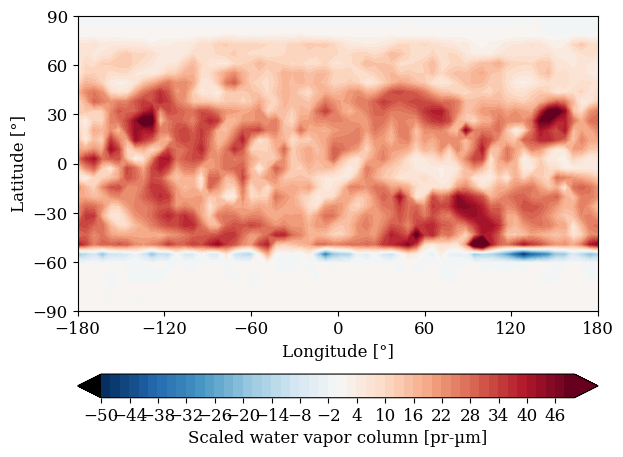

In [15]:
Z = [
    data_local_ave_roll[0,0,12,0,:,:]*1e9,
]

levels = [
    np.arange(-50,50.1,2),
    np.arange(-50,50.1,2),
    np.arange(-50,50.1,2),
]
titles = [
    '(a) Active, Homogeneous, Ls=150°',
    '(b) Active, Inhomogeneous, Ls=150°',
    '(c) Active, Homogeneous, Ls=180°',
    '(d) Active, Inhomogeneous, Ls=180°',
    '(e) Active, Homogeneous, Ls=210°',
    '(f) Active, Inhomogeneous, Ls=210°',
]


ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under()
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)

    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i],
        extend='both', cmap=cmap, 
        levels=levels[j], norm=norm
    )
    plt.colorbar(
        mappable, ax=ax, orientation='horizontal',
        ticks=levels[j][::3],
    ).set_label(labels[j]
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    #ax.set_title(titles[i])
plt.show()

In [3]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
]
variables = [
    'T-1h-p',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,70,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/T-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/T-1h-p.asc
(2, 1, 10, 24, 70, 32, 64)


k,j,i =  0 0 0
k,j,i =  0 1 1
k,j,i =  0 2 2


k,j,i =  0 3 3
k,j,i =  0 4 4


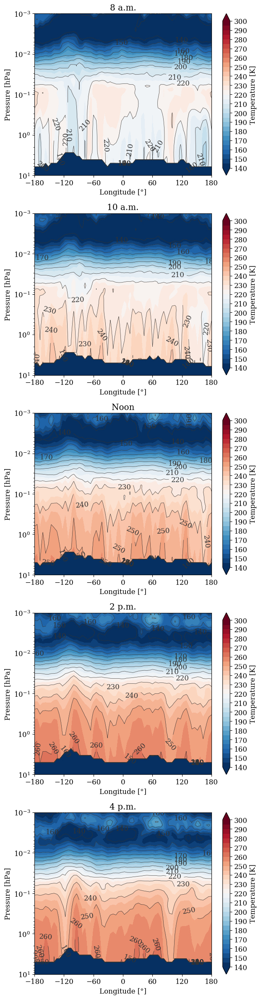

In [13]:
lat = 15
Z = [
    data_local_ave_roll[0,0, 8,:,lat,:],
    data_local_ave_roll[0,0,10,:,lat,:],
    data_local_ave_roll[0,0,12,:,lat,:],
    data_local_ave_roll[0,0,14,:,lat,:],
    data_local_ave_roll[0,0,16,:,lat,:],
]
levels = [
    np.arange(140,300.1,5),
]
labels = [
    r'Temperature [K]',
]
titles = [
    '8 a.m.',
    '10 a.m.',
    'Noon',
    '2 p.m.',
    '4 p.m.',
]
cmap = copy.copy(plt.get_cmap(cmap)) # RdBu_r, Blues, GnBu, PuBu

ncols,nrows=1,5
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    norm = colors.BoundaryNorm(levels[0], ncolors=cmap.N)
    mappable = ax.contourf(
        np.linspace(-180,180,64), plev, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[0], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
        ticks=levels[0][::2], 
    ).set_label(
        labels[0],
    )
    cs = ax.contour(
        np.linspace(-180,180,64), plev, Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[0][::2],
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_ylim(1e-3,10)
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-180,180,7))
#    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()

In [23]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
]
variables = [
    'RHOWTR-1h-p',
    'RHOAIR-1h-p',
    'pivel-1h-p',
    'U-1h-p',
    'QL2-1h-p',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,70,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/RHOWTR-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/RHOAIR-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/pivel-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/U-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/QL2-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/RHOWTR-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/RHOAIR-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/pivel-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/U-1h-p.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/QL2-1h-p.asc
(2, 5, 10, 24, 70, 32, 64)


In [26]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
]
variables = [
    'PS-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,1,32,64
PS = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        PS[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
PS = PS.reshape(nf,nv,nd,nt,nz,ny,nx)
print(PS.shape)

deg = 5.625
PS_local = localtime_aligner(PS,nx,deg) # Synchronize local time at all locations
PS_local_ave = day_average(PS_local) # 10 days average
PS_local_ave_roll = roll_longitude(PS_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/PS-1h.asc
(2, 1, 10, 24, 1, 32, 64)


In [27]:
files = [
#    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive/',
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/',
]
variables = [
    'wflux2s-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),10,24,1,32,64
wflux2s = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        wflux2s[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
wflux2s = wflux2s.reshape(nf,nv,nd,nt,nz,ny,nx)
print(wflux2s.shape)

deg = 5.625
wflux2s_local = localtime_aligner(wflux2s,nx,deg) # Synchronize local time at all locations
wflux2s_local_ave = day_average(wflux2s_local) # 10 days average
wflux2s_local_ave_roll = roll_longitude(wflux2s_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180/wflux2s-1h.asc
(1, 1, 10, 24, 1, 32, 64)


In [ ]:
R = 188.9       # 空気の気体定数 [J/(kg K)]
g = 3.72        # 重力加速度 [m/s^2]
def pvel_to_w(omega, rho):
    # 単位変換
    w = - omega*1e2 / (rho * g)
    return w

rho_H2O = data_local_ave_roll[:,0,:,:,:,:]
rho_CO2 = data_local_ave_roll[:,1,:,:,:,:]
omega   = data_local_ave_roll[:,2,:,:,:,:]
u       = data_local_ave_roll[:,3,:,:,:,:]
ql      = data_local_ave_roll[:,4,:,:,:,:]
w       = pvel_to_w(omega, rho_CO2)
scaled_H2O = rho_H2O * 1e8 / (PS_local_ave_roll[:,0,:,:,:,:] * 1e2 / 610)

[-85.         -79.51612903 -74.03225806 -68.5483871  -63.06451613
 -57.58064516 -52.09677419 -46.61290323 -41.12903226 -35.64516129
 -30.16129032 -24.67741935 -19.19354839 -13.70967742  -8.22580645
  -2.74193548   2.74193548   8.22580645  13.70967742  19.19354839
  24.67741935  30.16129032  35.64516129  41.12903226  46.61290323
  52.09677419  57.58064516  63.06451613  68.5483871   74.03225806
  79.51612903  85.        ]
k,j,i =  0 0 0
set_cmap again
k,j,i =  1 0 1
set_cmap again
k,j,i =  2 0 2
set_cmap
k,j,i =  0 1 3
set_cmap again
k,j,i =  1 1 4
set_cmap again
k,j,i =  2 1 5
set_cmap
k,j,i =  0 2 6
set_cmap again
k,j,i =  1 2 7
set_cmap again
k,j,i =  2 2 8
set_cmap
k,j,i =  0 3 9
set_cmap again
k,j,i =  1 3 10
set_cmap again
k,j,i =  2 3 11
set_cmap
k,j,i =  0 4 12
set_cmap again
k,j,i =  1 4 13
set_cmap again
k,j,i =  2 4 14
set_cmap


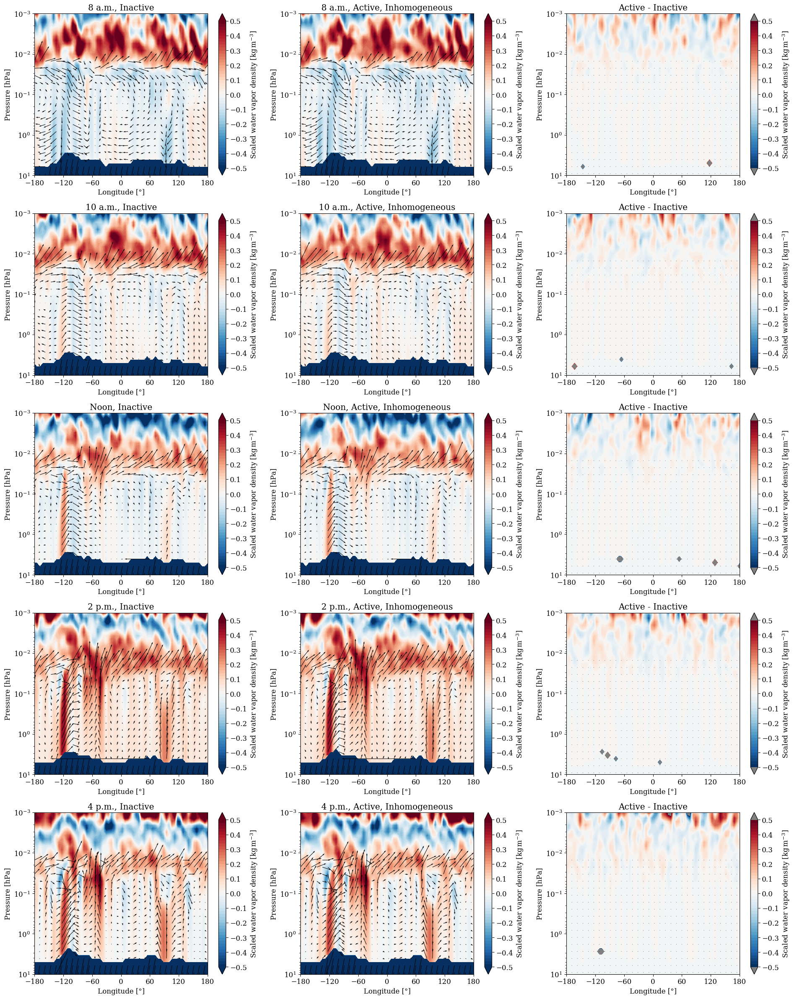

In [28]:
latitudes = np.linspace(-85,85,32)
print(latitudes)

lat = 15

Z = [
    w[0, 8,:,lat,:],
    w[1, 8,:,lat,:],
    w[1, 8,:,lat,:] - w[0, 8,:,lat,:],
    w[0,10,:,lat,:],
    w[1,10,:,lat,:],
    w[1,10,:,lat,:] - w[0,10,:,lat,:],
    w[0,12,:,lat,:],
    w[1,12,:,lat,:],
    w[1,12,:,lat,:] - w[0,12,:,lat,:],
    w[0,14,:,lat,:],
    w[1,14,:,lat,:],
    w[1,14,:,lat,:] - w[0,14,:,lat,:],
    w[0,16,:,lat,:],
    w[1,16,:,lat,:],
    w[1,16,:,lat,:] - w[0,16,:,lat,:],
]
levels = [
#    np.arange(0,200.1,5),
#    np.arange(0,200.1,5),
#    np.arange(-20,20.1,0.5),
    np.arange(-0.5,0.51,0.02),
    np.arange(140,300.1,5),
]
labels = [
    r'Scaled water vapor density [$\rm kg \,m^{-3}$]',
    r'Vertical velocity [$\rm m \,s^{-1}$]',
    r'Temperature [K]',
]
titles = [
    '8 a.m., Inactive',
    '8 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    '10 a.m., Inactive',
    '10 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    'Noon, Inactive',
    'Noon, Active, Inhomogeneous',
    'Active - Inactive',
    '2 p.m., Inactive',
    '2 p.m., Active, Inhomogeneous',
    'Active - Inactive',
    '4 p.m., Inactive',
    '4 p.m., Active, Inhomogeneous',
    'Active - Inactive',
]
step=2
vertical_exag = 200
U = [
    u[0, 8,:36:step,lat,::step],
    u[1, 8,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,10,:36:step,lat,::step],
    u[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,12,:36:step,lat,::step],
    u[1,12,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,14,:36:step,lat,::step],
    u[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,16,:36:step,lat,::step],
    u[1,16,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]
W = [
    w[0, 8,:36:step,lat,::step],
    w[1, 8,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,10,:36:step,lat,::step],
    w[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,12,:36:step,lat,::step],
    w[1,12,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,14,:36:step,lat,::step],
    w[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,16,:36:step,lat,::step],
    w[1,16,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]

ncols,nrows=3,5
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    if (k==2):
        print('set_cmap')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
        cmap.set_under('0.5')
        cmap.set_over ('0.5')
    else:
        print('set_cmap again')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
#        cmap.set_under()
#        cmap.set_over ()
    norm = colors.BoundaryNorm(levels[0], ncolors=cmap_colors.N)
    mappable = ax.contourf(
        np.linspace(-180,180,64), plev, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[0], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
        ticks=levels[0][::5],
    ).set_label(
        labels[0],
    )
    ax.quiver(
        np.linspace(-180,180,64)[::step], plev[:36:step],
        U[i], W[i]*vertical_exag,
        scale=700, scale_units='width'
    )
#    cs = ax.contour(
#        np.linspace(-180,180,64), plev, Z[i],
#        colors='0.2', linewidths=0.5, 
#        levels=levels[0][::2],
#    )
#    ax.clabel(
#        cs, fmt='%1.0f'
#    )
    ax.set_ylim(1e-3,10)
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-180,180,7))
#    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()

k,j,i =  0 0 0
set_cmap again
k,j,i =  1 0 1
set_cmap again
k,j,i =  2 0 2
set_cmap
k,j,i =  0 1 3
set_cmap again
k,j,i =  1 1 4
set_cmap again
k,j,i =  2 1 5
set_cmap
k,j,i =  0 2 6
set_cmap again
k,j,i =  1 2 7
set_cmap again
k,j,i =  2 2 8
set_cmap
k,j,i =  0 3 9
set_cmap again
k,j,i =  1 3 10
set_cmap again
k,j,i =  2 3 11
set_cmap
k,j,i =  0 4 12
set_cmap again
k,j,i =  1 4 13
set_cmap again
k,j,i =  2 4 14
set_cmap


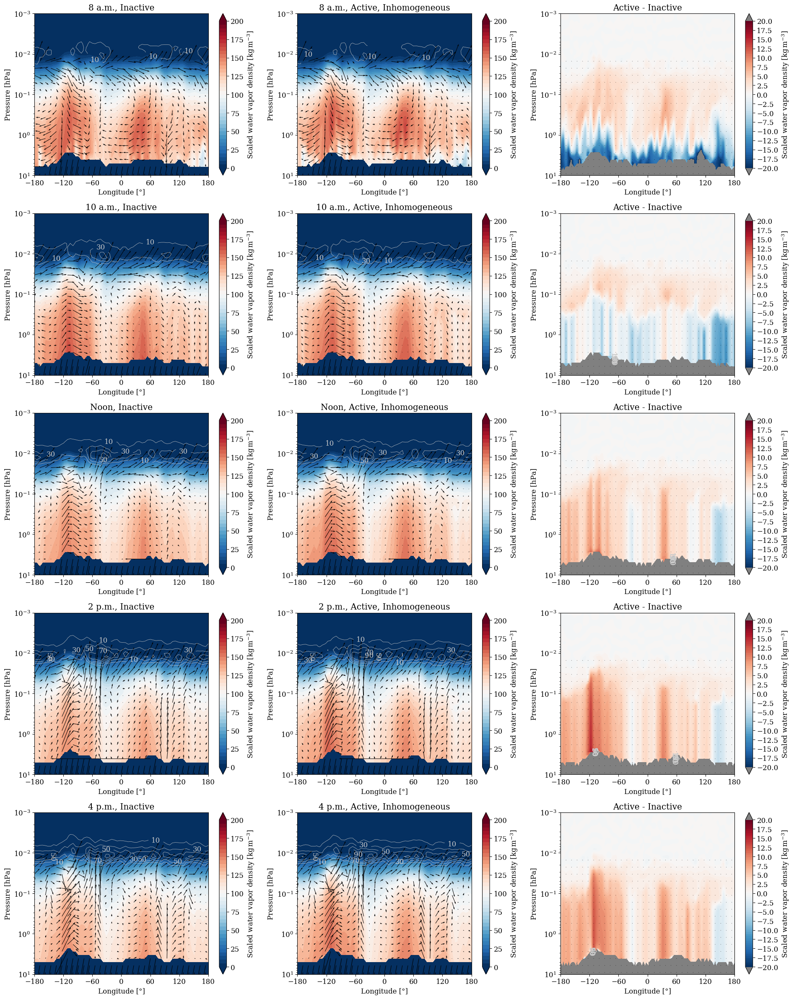

In [33]:
lat = 15
Z = [
    scaled_H2O[0, 8,:,lat,:],
    scaled_H2O[1, 8,:,lat,:],
    scaled_H2O[1, 8,:,lat,:] - scaled_H2O[0, 8,:,lat,:],
    scaled_H2O[0,10,:,lat,:],
    scaled_H2O[1,10,:,lat,:],
    scaled_H2O[1,10,:,lat,:] - scaled_H2O[0,10,:,lat,:],
    scaled_H2O[0,12,:,lat,:],
    scaled_H2O[1,12,:,lat,:],
    scaled_H2O[1,12,:,lat,:] - scaled_H2O[0,12,:,lat,:],
    scaled_H2O[0,14,:,lat,:],
    scaled_H2O[1,14,:,lat,:],
    scaled_H2O[1,14,:,lat,:] - scaled_H2O[0,14,:,lat,:],
    scaled_H2O[0,16,:,lat,:],
    scaled_H2O[1,16,:,lat,:],
    scaled_H2O[1,16,:,lat,:] - scaled_H2O[0,16,:,lat,:],
]
contours = [
    ql[0, 8,:,lat,:],
    ql[1, 8,:,lat,:],
    ql[1, 8,:,lat,:] - ql[0, 8,:,lat,:],
    ql[0,10,:,lat,:],
    ql[1,10,:,lat,:],
    ql[1,10,:,lat,:] - ql[0,10,:,lat,:],
    ql[0,12,:,lat,:],
    ql[1,12,:,lat,:],
    ql[1,12,:,lat,:] - ql[0,12,:,lat,:],
    ql[0,14,:,lat,:],
    ql[1,14,:,lat,:],
    ql[1,14,:,lat,:] - ql[0,14,:,lat,:],
    ql[0,16,:,lat,:],
    ql[1,16,:,lat,:],
    ql[1,16,:,lat,:] - ql[0,16,:,lat,:],
]
levels = [
    np.arange(0,200.1,5),
    np.arange(0,200.1,5),
    np.arange(-20,20.1,0.5),
    np.arange(-0.5,0.51,0.02),
    np.arange(140,300.1,5),
]
labels = [
    r'Scaled water vapor density [$\rm kg \,m^{-3}$]',
    r'Vertical velocity [$\rm m \,s^{-1}$]',
    r'Temperature [K]',
]
titles = [
    '8 a.m., Inactive',
    '8 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    '10 a.m., Inactive',
    '10 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    'Noon, Inactive',
    'Noon, Active, Inhomogeneous',
    'Active - Inactive',
    '2 p.m., Inactive',
    '2 p.m., Active, Inhomogeneous',
    'Active - Inactive',
    '4 p.m., Inactive',
    '4 p.m., Active, Inhomogeneous',
    'Active - Inactive',
]
step=2
vertical_exag = 200
U = [
    u[0, 8,:36:step,lat,::step],
    u[1, 8,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,10,:36:step,lat,::step],
    u[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,12,:36:step,lat,::step],
    u[1,12,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,14,:36:step,lat,::step],
    u[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,16,:36:step,lat,::step],
    u[1,16,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]
W = [
    w[0, 8,:36:step,lat,::step],
    w[1, 8,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,10,:36:step,lat,::step],
    w[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,12,:36:step,lat,::step],
    w[1,12,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,14,:36:step,lat,::step],
    w[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,16,:36:step,lat,::step],
    w[1,16,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]

ncols,nrows=3,5
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    if (k==2):
        print('set_cmap')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
        cmap.set_under('0.5')
        cmap.set_over ('0.5')
    else:
        print('set_cmap again')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
#        cmap.set_under()
#        cmap.set_over ()
    norm = colors.BoundaryNorm(levels[k], ncolors=cmap_colors.N)
    mappable = ax.contourf(
        np.linspace(-180,180,64), plev, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[k], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
        ticks=levels[k][::5],
    ).set_label(
        labels[0],
    )
    ax.quiver(
        np.linspace(-180,180,64)[::step], plev[:36:step],
        U[i], W[i]*vertical_exag,
        scale=700, scale_units='width'
    )
    cs = ax.contour(
        np.linspace(-180,180,64), plev, contours[i],
        colors='0.8', linewidths=0.5, 
        levels=np.arange(10,200.1,20),
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_ylim(1e-3,10)
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-180,180,7))
#    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()

k,j,i =  0 0 0
set_cmap again
k,j,i =  1 0 1
set_cmap again
k,j,i =  2 0 2
set_cmap
k,j,i =  0 1 3
set_cmap again
k,j,i =  1 1 4
set_cmap again
k,j,i =  2 1 5
set_cmap
k,j,i =  0 2 6
set_cmap again
k,j,i =  1 2 7
set_cmap again
k,j,i =  2 2 8
set_cmap
k,j,i =  0 3 9
set_cmap again
k,j,i =  1 3 10
set_cmap again
k,j,i =  2 3 11
set_cmap
k,j,i =  0 4 12
set_cmap again
k,j,i =  1 4 13
set_cmap again
k,j,i =  2 4 14
set_cmap
k,j,i =  0 5 15
set_cmap again
k,j,i =  1 5 16
set_cmap again
k,j,i =  2 5 17
set_cmap


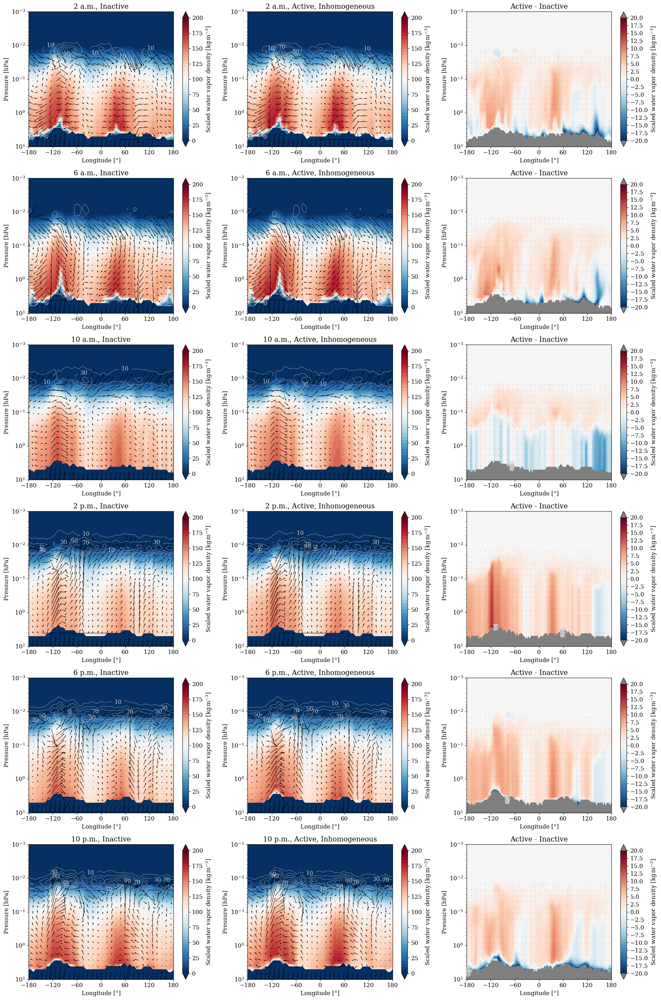

In [38]:
lat = 15
Z = [
    scaled_H2O[0, 2,:,lat,:],
    scaled_H2O[1, 2,:,lat,:],
    scaled_H2O[1, 2,:,lat,:] - scaled_H2O[0, 2,:,lat,:],
    scaled_H2O[0, 6,:,lat,:],
    scaled_H2O[1, 6,:,lat,:],
    scaled_H2O[1, 6,:,lat,:] - scaled_H2O[0, 6,:,lat,:],
    scaled_H2O[0,10,:,lat,:],
    scaled_H2O[1,10,:,lat,:],
    scaled_H2O[1,10,:,lat,:] - scaled_H2O[0,10,:,lat,:],
    scaled_H2O[0,14,:,lat,:],
    scaled_H2O[1,14,:,lat,:],
    scaled_H2O[1,14,:,lat,:] - scaled_H2O[0,14,:,lat,:],
    scaled_H2O[0,18,:,lat,:],
    scaled_H2O[1,18,:,lat,:],
    scaled_H2O[1,18,:,lat,:] - scaled_H2O[0,18,:,lat,:],
    scaled_H2O[0,22,:,lat,:],
    scaled_H2O[1,22,:,lat,:],
    scaled_H2O[1,22,:,lat,:] - scaled_H2O[0,22,:,lat,:],
]
contours = [
    ql[0, 2,:,lat,:],
    ql[1, 2,:,lat,:],
    ql[1, 2,:,lat,:] - ql[0, 2,:,lat,:],
    ql[0, 6,:,lat,:],
    ql[1, 6,:,lat,:],
    ql[1, 6,:,lat,:] - ql[0, 6,:,lat,:],
    ql[0,10,:,lat,:],
    ql[1,10,:,lat,:],
    ql[1,10,:,lat,:] - ql[0,10,:,lat,:],
    ql[0,14,:,lat,:],
    ql[1,14,:,lat,:],
    ql[1,14,:,lat,:] - ql[0,14,:,lat,:],
    ql[0,18,:,lat,:],
    ql[1,18,:,lat,:],
    ql[1,18,:,lat,:] - ql[0,18,:,lat,:],
    ql[0,22,:,lat,:],
    ql[1,22,:,lat,:],
    ql[1,22,:,lat,:] - ql[0,22,:,lat,:],
]
levels = [
    np.arange(0,200.1,5),
    np.arange(0,200.1,5),
    np.arange(-20,20.1,0.5),
    np.arange(-0.5,0.51,0.02),
    np.arange(140,300.1,5),
]
labels = [
    r'Scaled water vapor density [$\rm kg \,m^{-3}$]',
    r'Vertical velocity [$\rm m \,s^{-1}$]',
    r'Temperature [K]',
]
titles = [
    '2 a.m., Inactive',
    '2 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    '6 a.m., Inactive',
    '6 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    '10 a.m., Inactive',
    '10 a.m., Active, Inhomogeneous',
    'Active - Inactive',
    '2 p.m., Inactive',
    '2 p.m., Active, Inhomogeneous',
    'Active - Inactive',
    '6 p.m., Inactive',
    '6 p.m., Active, Inhomogeneous',
    'Active - Inactive',
    '10 p.m., Inactive',
    '10 p.m., Active, Inhomogeneous',
    'Active - Inactive',
]
step=2
vertical_exag = 200
U = [
    u[0, 2,:36:step,lat,::step],
    u[1, 2,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0, 6,:36:step,lat,::step],
    u[1, 6,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,10,:36:step,lat,::step],
    u[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,14,:36:step,lat,::step],
    u[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,18,:36:step,lat,::step],
    u[1,18,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    u[0,22,:36:step,lat,::step],
    u[1,22,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]
W = [
    w[0, 2,:36:step,lat,::step],
    w[1, 2,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0, 6,:36:step,lat,::step],
    w[1, 6,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,10,:36:step,lat,::step],
    w[1,10,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,14,:36:step,lat,::step],
    w[1,14,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,18,:36:step,lat,::step],
    w[1,18,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
    w[0,22,:36:step,lat,::step],
    w[1,22,:36:step,lat,::step],
    np.zeros_like(u[1, 8,:36:step,lat,::step]),
]

ncols,nrows=3,6
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    if (k==2):
        print('set_cmap')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
        cmap.set_under('0.5')
        cmap.set_over ('0.5')
    else:
        print('set_cmap again')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
#        cmap.set_under()
#        cmap.set_over ()
    norm = colors.BoundaryNorm(levels[k], ncolors=cmap_colors.N)
    mappable = ax.contourf(
        np.linspace(-180,180,64), plev, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[k], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
        ticks=levels[k][::5],
    ).set_label(
        labels[0],
    )
    ax.quiver(
        np.linspace(-180,180,64)[::step], plev[:36:step],
        U[i], W[i]*vertical_exag,
        scale=700, scale_units='width'
    )
    cs = ax.contour(
        np.linspace(-180,180,64), plev, contours[i],
        colors='0.8', linewidths=0.5, 
        levels=np.arange(10,200.1,20),
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_ylim(1e-3,10)
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-180,180,7))
#    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()

[-180.    -174.375 -168.75  -163.125 -157.5   -151.875 -146.25  -140.625
 -135.    -129.375 -123.75  -118.125 -112.5   -106.875 -101.25   -95.625
  -90.     -84.375  -78.75   -73.125  -67.5    -61.875  -56.25   -50.625
  -45.     -39.375  -33.75   -28.125  -22.5    -16.875  -11.25    -5.625
    0.       5.625   11.25    16.875   22.5     28.125   33.75    39.375
   45.      50.625   56.25    61.875   67.5     73.125   78.75    84.375
   90.      95.625  101.25   106.875  112.5    118.125  123.75   129.375
  135.     140.625  146.25   151.875  157.5    163.125  168.75   174.375]
[-85.         -79.51612903 -74.03225806 -68.5483871  -63.06451613
 -57.58064516 -52.09677419 -46.61290323 -41.12903226 -35.64516129
 -30.16129032 -24.67741935 -19.19354839 -13.70967742  -8.22580645
  -2.74193548   2.74193548   8.22580645  13.70967742  19.19354839
  24.67741935  30.16129032  35.64516129  41.12903226  46.61290323
  52.09677419  57.58064516  63.06451613  68.5483871   74.03225806
  79.51612903  85. 

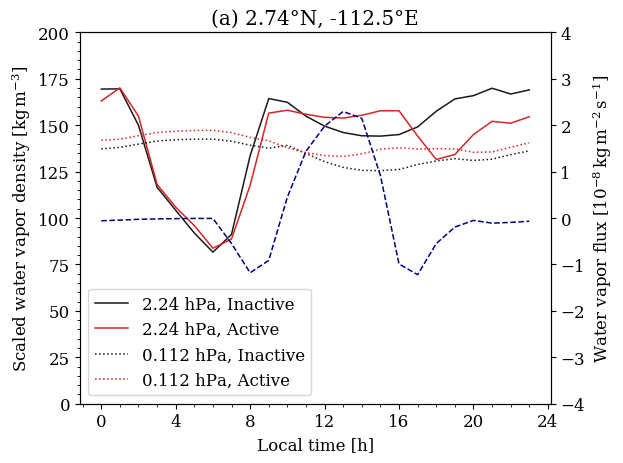

In [28]:
longitudes = np.linspace(-180,180-360/64,64)
print(longitudes)
#[-180.    -174.375 -168.75  -163.125 -157.5   -151.875 -146.25  -140.625 #8
# -135.    -129.375 -123.75  -118.125 -112.5   -106.875 -101.25   -95.625 #16
#  -90.     -84.375  -78.75   -73.125  -67.5    -61.875  -56.25   -50.625 #24
#  -45.     -39.375  -33.75   -28.125  -22.5    -16.875  -11.25    -5.625 #32
#    0.       5.625   11.25    16.875   22.5     28.125   33.75    39.375 #40
#   45.      50.625   56.25    61.875   67.5     73.125   78.75    84.375 #48
#   90.      95.625  101.25   106.875  112.5    118.125  123.75   129.375 #56
#  135.     140.625  146.25   151.875  157.5    163.125  168.75   174.375 #64]
latitudes = np.linspace(-85,85,32)
print(latitudes)

lat,lon = 15,12
#lat,lon = 15,37

titles = [
    '(a) '+str(f"{-latitudes[lat]:.3}")+'°N, '+str(f"{longitudes[lon]:.4}")+'°E',
]

ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    ax2 = ax.twinx()

    ax.plot(scaled_H2O[0,:, 9,lat,lon], linewidth=1.1, color='0.1'  , linestyle='solid' , label=str(f"{plev[ 9]:.3}"+" hPa, Inactive"))
    ax.plot(scaled_H2O[1,:, 9,lat,lon], linewidth=1.1, color='tab:red', linestyle='solid' , label=str(f"{plev[ 9]:.3}"+" hPa, Active"))
    ax.plot(scaled_H2O[0,:,24,lat,lon], linewidth=1.1, color='0.1'  , linestyle='dotted', label=str(f"{plev[24]:.3}"+" hPa, Inactive"))
    ax.plot(scaled_H2O[1,:,24,lat,lon], linewidth=1.1, color='tab:red', linestyle='dotted', label=str(f"{plev[24]:.3}"+" hPa, Active"))

#    ax.plot(scaled_H2O[0,:, 6,lat,lon], linewidth=1.1, color='0.1'  , linestyle='solid' , label=str(f"{plev[ 5]:.3}")+" hPa, Inactive")
#    ax.plot(scaled_H2O[1,:, 6,lat,lon], linewidth=1.1, color='tab:red', linestyle='solid' , label=str(f"{plev[ 5]:.3}")+" hPa, Active")
#    ax.plot(scaled_H2O[0,:,13,lat,lon], linewidth=1.1, color='0.1'  , linestyle='dotted', label=str(f"{plev[13]:.3}")+" hPa, Inactive")
#    ax.plot(scaled_H2O[1,:,13,lat,lon], linewidth=1.1, color='tab:red', linestyle='dotted', label=str(f"{plev[13]:.3}")+" hPa, Active")

    ax2.plot(wflux2s_local_ave_roll[0,0,:,0,lat,lon]*1e8, linewidth=1.1, color='navy', linestyle='dashed', label='Water flux')

    ax.set_ylim(0,200)
    ax2.set_ylim(-4,4)

    ax.set_xticks(np.linspace(0,24,7))
#    ax.set_yticks(np.linspace(-90,90,7))

    ax.set_xlabel('Local time [h]')
    ax.set_ylabel(r'Scaled water vapor density [$\rm kg \,m^{-3}$]')
    ax2.set_ylabel(r'Water vapor flux [$10^{-8} \rm \,kg \,m^{-2} \,s^{-1}$]')
    ax.set_title(titles[i])

    ax.minorticks_on()
    ax.legend()
plt.show()

In [39]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/',
]
variables = [
    'PS-1h',
    'colwv2-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),49,24,1,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/PS-1h.asc
/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/colwv2-1h.asc
(1, 2, 49, 24, 1, 32, 64)


In [40]:
deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local[:,:,10:10+10,:,:,:,:]) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°
#data_local_ave_zm = zonal_mean(data_local_ave) # zonal mean

ps = data_local_ave_roll[:,0,14,0,:,:]*1e2
wv = data_local_ave_roll[:,1,14,0,:,:]*1e6
#ps = data_local_ave_roll[:,0,2,0,:,:]*1e2
#wv = data_local_ave_roll[:,1,2,0,:,:]*1e6
scaled_wv = wv / (ps / 610)
print(scaled_wv.shape)

(1, 32, 64)


k,j,i =  0 0 0


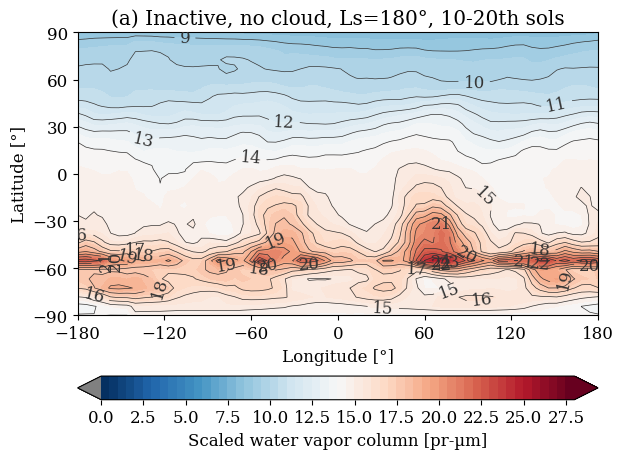

In [43]:
ncols,nrows=1,1
levels = [
    np.arange(0,28.1,0.5),
    np.arange(0,28.1,0.5),
    np.arange(0,28.1,0.5),
]
Z = [
#    np.zeros_like(scaled_wv[0,:,:]),
    scaled_wv[0,:,:],
#    np.zeros_like(scaled_wv[0,:,:]),
]
labels = [
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
    r'Scaled water vapor column [pr-µm]',
]
titles = [
#    '(a) Inactive, no cloud, Ls=180°, First 10 sols',
    '(a) Inactive, no cloud, Ls=180°, 10-20th sols',
]

plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
    cmap.set_under('0.5')
    norm = colors.BoundaryNorm(levels[j], ncolors=cmap.N)
    mappable = ax.contourf(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i],
        extend='both', cmap=cmap, levels=levels[j], norm=norm
    )
    plt.colorbar(mappable, ax=ax, ticks=levels[j][::5], orientation='horizontal'
    ).set_label(labels[j])
    cs = ax.contour(
        np.linspace(-180,180,nx), np.linspace(-90,90,32)[::-1], Z[i],
        colors='0.2', linewidths=0.5, levels=levels[j][::2]
    )
    ax.clabel(
        cs, fmt='%1.0f'
    )
    ax.set_xticks(np.linspace(-180,180,7))
    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Latitude [°]')
    ax.set_title(titles[i])
#plt.savefig('draw_map_'+titles[k]+'.pdf', dpi=300)
plt.show()


In [44]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/',
]
variables = [
    'RHOWTR-1h-p',
#    'RHOAIR-1h-p',
#    'pivel-1h-p',
#    'U-1h-p',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),49,24,70,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

deg = 5.625
data_local = localtime_aligner(data,nx,deg) # Synchronize local time at all locations
data_local_ave = day_average(data_local) # 10 days average
data_local_ave_roll = roll_longitude(data_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/RHOWTR-1h-p.asc


(1, 1, 49, 24, 70, 32, 64)


In [45]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/',
]
variables = [
    'PS-1h',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),49,24,1,32,64
PS = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        PS[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
PS = PS.reshape(nf,nv,nd,nt,nz,ny,nx)
print(PS.shape)

deg = 5.625
PS_local = localtime_aligner(PS,nx,deg) # Synchronize local time at all locations
PS_local_ave = day_average(PS_local) # 10 days average
PS_local_ave_roll = roll_longitude(PS_local_ave,nx) # roll longitudes 180°

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom-Ls180-inactive-nocloud/PS-1h.asc
(1, 1, 49, 24, 1, 32, 64)


[-85.         -79.51612903 -74.03225806 -68.5483871  -63.06451613
 -57.58064516 -52.09677419 -46.61290323 -41.12903226 -35.64516129
 -30.16129032 -24.67741935 -19.19354839 -13.70967742  -8.22580645
  -2.74193548   2.74193548   8.22580645  13.70967742  19.19354839
  24.67741935  30.16129032  35.64516129  41.12903226  46.61290323
  52.09677419  57.58064516  63.06451613  68.5483871   74.03225806
  79.51612903  85.        ]
k,j,i =  0 0 0
set_cmap again
k,j,i =  0 1 1
set_cmap again
k,j,i =  0 2 2
set_cmap again
k,j,i =  0 3 3
set_cmap again
k,j,i =  0 4 4
set_cmap again


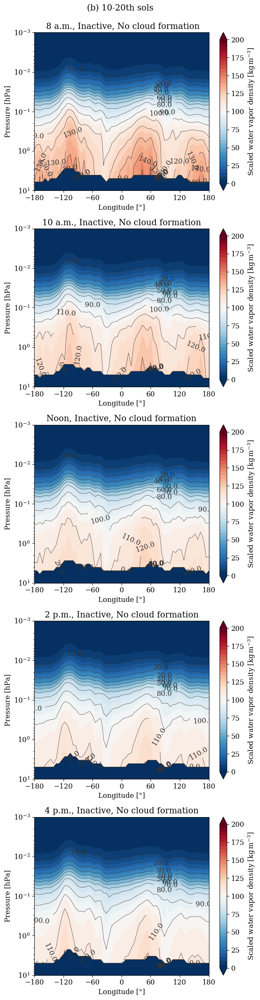

In [47]:
R = 188.9       # 空気の気体定数 [J/(kg K)]
g = 3.72        # 重力加速度 [m/s^2]
def pvel_to_w(omega, rho):
    # 単位変換
    w = - omega*1e2 / (rho * g)
    return w

rho_H2O = data_local_ave_roll[:,0,:,:,:,:]
#rho_CO2 = data_local_ave_roll[:,1,:,:,:,:]
#omega   = data_local_ave_roll[:,2,:,:,:,:]
#u       = data_local_ave_roll[:,3,:,:,:,:]
#w       = pvel_to_w(omega, rho_CO2)
scaled_H2O = rho_H2O * 1e8 / (PS_local_ave_roll[:,0,:,:,:,:] * 1e2 / 610)

latitudes = np.linspace(-85,85,32)
print(latitudes)
lat = 15
Z = [
    scaled_H2O[0, 8,:,lat,:],
    scaled_H2O[0,10,:,lat,:],
    scaled_H2O[0,12,:,lat,:],
    scaled_H2O[0,14,:,lat,:],
    scaled_H2O[0,16,:,lat,:],
]
levels = [
    np.arange(0,200.1,5),
]
labels = [
    r'Scaled water vapor density [$\rm kg \,m^{-3}$]',
]
titles = [
    '(b) 10-20th sols \n\n 8 a.m., Inactive, No cloud formation',
    '10 a.m., Inactive, No cloud formation',
    'Noon, Inactive, No cloud formation',
    '2 p.m., Inactive, No cloud formation',
    '4 p.m., Inactive, No cloud formation',
]

ncols,nrows=1,5
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    if (k==2):
        print('set_cmap')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
        cmap.set_under('0.5')
        cmap.set_over ('0.5')
    else:
        print('set_cmap again')
        cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
#        cmap.set_under()
#        cmap.set_over ()
    norm = colors.BoundaryNorm(levels[0], ncolors=cmap_colors.N)
    mappable = ax.contourf(
        np.linspace(-180,180,64), plev, Z[i],
        extend='both', cmap=cmap, 
        levels=levels[0], norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
        ticks=levels[0][::5],
    ).set_label(
        labels[0],
    )
    cs = ax.contour(
        np.linspace(-180,180,64), plev, Z[i],
        colors='0.2', linewidths=0.5, 
        levels=levels[0][::2]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )

    ax.set_ylim(1e-3,10)
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xticks(np.linspace(-180,180,7))
#    ax.set_yticks(np.linspace(-90,90,7))
    ax.set_xlabel('Longitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()

In [26]:
files = [
    '/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/',
]
variables = [
    'STF-p',
]
nf,nv,nd,nt,nz,ny,nx = len(files),len(variables),669,1,70,32,64
data = np.zeros((nf,nv,nd*nt*nz*ny*nx))
for i in range(nf):
    for j in range(nv):
        print(files[i] + variables[j] + '.asc')
        data[i,j] = np.loadtxt(files[i] + variables[j] + '.asc')
data = data.reshape(nf,nv,nd,nt,nz,ny,nx)
print(data.shape)

/mnt/dram2/koba/data/Kobayashi-2026/MIRAI1k-active-adsinhom/STF-p.asc


(1, 1, 669, 1, 70, 32, 64)


k,j,i =  0 0 0


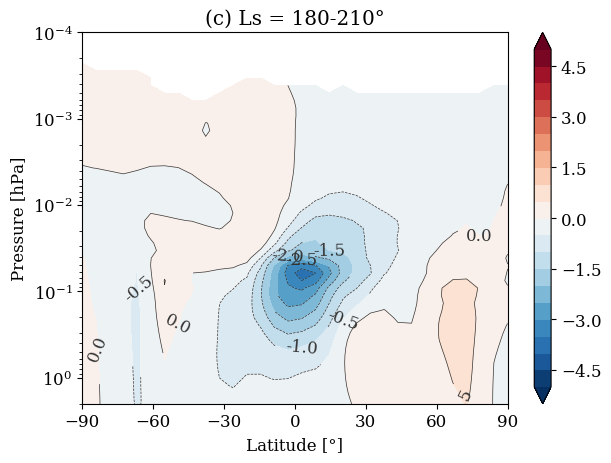

In [37]:
data_Ls270_300 = day_average(data[:,:,514:562,:,:,:,:])
data_Ls90_120  = day_average(data[:,:,193:257,:,:,:,:])
data_Ls0_30    = day_average(data[:,:,:61,:,:,:,:])
data_Ls180_210 = day_average(data[:,:,371:421,:,:,:,:])

data_zm_Ls270_300 = zonal_mean(data_Ls270_300)
data_zm_Ls90_120 = zonal_mean(data_Ls90_120)
data_zm_Ls0_30 = zonal_mean(data_Ls0_30)
data_zm_Ls180_210 = zonal_mean(data_Ls180_210)

Z = [
#    data_zm_Ls0_30   [0,0,0,:,:],
#    data_zm_Ls90_120 [0,0,0,:,:],
    data_zm_Ls180_210[0,0,0,:,:],
#    data_zm_Ls270_300[0,0,0,:,:],
]
sigma = [
  1.0000    , 0.99000    , 0.97000    , 0.93000    , 0.85000,
 0.75000    , 0.63000    , 0.50000    , 0.35243    , 0.24835,
 0.17501    , 0.12333    , 8.69070E-02, 6.12430E-02, 4.31570E-02,
 3.04120E-02, 2.14310E-02, 1.51020E-02, 1.06420E-02, 7.49950E-03,
 5.28480E-03, 3.72420E-03, 2.62440E-03, 1.84940E-03, 1.30320E-03,
 9.18370E-04, 6.47160E-04, 4.33810E-04, 2.76610E-04, 1.67770E-04,
 9.67950E-05, 5.58460E-05,  0.0000
]
levels = [
    np.arange(-5,5.1,0.5),
]
cmap = copy.copy(plt.get_cmap(cmap_colors)) # RdBu_r, Blues, GnBu, PuBu
titles = [
#    'Ls = 0-30°',
#    'Ls = 90-120°',
    '(c) Ls = 180-210°',
#    'Ls = 270-300°',
]

ncols,nrows=1,1
plt.rcParams['figure.figsize'] = [6.4*ncols, 4.8*nrows]
fig,axes = plt.subplots(nrows=nrows, ncols=ncols)
for i in range(ncols*nrows):
    k,j=i%ncols,int(i/ncols)
    print('k,j,i = ', k,j,i)
    if (ncols==1 and nrows==1):
        ax=axes
    elif (ncols==1):
        ax=axes[j]
    elif (nrows==1):
        ax=axes[k]
    else:
        ax=axes[j,k]
    mappable = ax.contourf(
        np.linspace(-90,90,32)[::-1], plev, Z[i]/1e9,
#        np.linspace(-90,90,32)[::-1], sigma, data_zm[0,0,0,:,:]/1e9,
        extend='both', cmap=cmap, 
        levels=levels[0], #norm=norm,
    )
    plt.colorbar(
        mappable, ax=ax,
#        ticks=levels[0][::2], 
#    ).set_label(
#        labels[0],
    )
    cs = ax.contour(
        np.linspace(-90,90,32)[::-1], plev, Z[i]/1e9,
        colors='0.2', linewidths=0.5, 
        levels=levels[0]
    )
    ax.clabel(
        cs, fmt='%1.1f'
    )

    ax.set_ylim(1e-4,2)
    ax.set_yscale('log')
    ax.invert_yaxis()

    ax.set_xticks(np.linspace(-90,90,7))
    ax.set_xlabel('Latitude [°]')
    ax.set_ylabel('Pressure [hPa]')
    ax.set_title(titles[i])
plt.show()